# Usage of Costs Prediction Model

# Load Libraries

In [19]:
# Cargar librerias
from __future__ import absolute_import, division, print_function, unicode_literals
import os
from datetime import datetime
import datetime as dt  # Used to manage dates
from dateutil.relativedelta import relativedelta
import warnings                   # To ignore the warnings warnings.filterwarnings("ignore")
import requests
import pickle

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.pylab import rcParams 
import seaborn as sns

from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_squared_log_error
from sklearn.decomposition import PCA
from sklearn import preprocessing

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

from xgboost import XGBRegressor, plot_importance 


from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report

from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import BayesianRidge
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor 
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import ElasticNetCV
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.svm import LinearSVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import SGDRegressor
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import Ridge, RidgeCV

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import minmax_scale
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import PowerTransformer

import scipy.stats as stats 
from scipy.stats import norm, skew
import scikitplot as skplt

import plotly.offline as py
from plotly import graph_objs as go
from plotly import figure_factory as ff
import plotly.express as px
from plotly.subplots import make_subplots

warnings.filterwarnings("ignore")
warnings.simplefilter("ignore", DeprecationWarning)
warnings.simplefilter("ignore", FutureWarning, )

%matplotlib inline
pd.plotting.register_matplotlib_converters()
pd.options.display.float_format = '{:.4f}'.format
rcParams.update({'figure.autolayout': True, 'figure.figsize':(12,8),'axes.titlesize':14})

pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)
pd.set_option('max_info_rows', 100)

# to make this notebook's output identical at every run
np.random.seed(42)

# Function Definitions

In [2]:
def save_data(df, file_name):
    # Write data to CSV File
    df.to_csv(path_or_buf=file_name, sep=',',index=False, encoding='utf-8')
    return

def read_data(file_name):
    df = pd.read_csv(file_name, sep=',', index_col=False, header='infer', float_precision=2 )
    return df

def draw_col_shape(df_feature,cols):
    # draw a bar graph with he number of members of a columns specify in field Cols
    
    # Dictionary for X Axis Labels
    dict_cols = { 'income':'Income', 'member_status':'Member Status','state_grouped': 'State', 'credit_ranges':'Credit Range',
                 'cancel_reason':'Cancel Reason','renew_method':'Renewal Method','sc_vehicle_manufacturer_name':'Vehicle Manufacturer',
                 'sc_vehicle_model_name':'Vehicle Model','race': 'Ethnic Group','home_owner': 'Home Owner','education':'Education Level', 
                 'dwelling_type': 'Dwelling Type', 'gender':'Gender','occupation_code':'Occupation', 'occupation_group':'Occupation Group',
                 'occupant_type': 'Occupant Type','mosaic_household':'Mosaic household','mosaic_global_household':'Global Mosaic',
                 'kcl_b_ind_mosaicsgrouping':'Mosaic Grouping', 'plus_indicator_description':'Membership Type',
                 'tenure':'Tenure Range', 'generation':'Generation', 'total_calls':'Total Breakdown Calls', 'aaa_mortgage':'Used Mortgage Service',
                  'aaa_credit_card':'Use Credit Card Service','aaa_deposit':'Use Deposit Service','aaa_travel':'Travel Services',
                 'aaa_home_equity':'Use Home Equity Service', 'aaa_financial_service':'Use Financial Service', 
                 'aaa_auto_insurance':'Use Insurance Service', 'vehicle':'Vehicle','total_member_cost':'Total Member Avg. Costs',
                 'no_members':'Total Members with Household', 'aaa_id_theft':'ID Theft Service', 'use_road_side':'Use Roadside'
                }


    # number of members per state

    for col in cols:
        counts = df_feature[col].value_counts()
        sns.set(style="whitegrid")
        plt.axhline(0, color="k", clip_on=False)
        plt.ylabel("# of Classes",fontsize=14, fontweight='bold')
        plt.xlabel("Classes", fontsize=14, fontweight='bold')
        plt.title('Total  Number of Classes',loc='center', fontdict={'fontsize':14, 'fontweight':'bold'})
        sns.barplot(counts.index, counts.values)
        plt.xticks(
            rotation=45, 
            horizontalalignment='right',
            fontweight='light',
            fontsize='large')
        i = 0
        for v in list(counts.index):
            plt.text(i-.25, counts.values[v], str(counts.values[v]), color='blue', fontweight='bold')
            i +=1
        plt.show()
        counts = pd.DataFrame(df_feature[col].value_counts().nlargest(15), index=None)
        counts.reset_index(inplace=True)
        counts.rename(columns={"index": dict_cols[col], col: "# of Classes"}, inplace=True)
        fig = ff.create_table(counts, height_constant=30, index=False)
        py.iplot(fig)
        return

def cross_entropy(predictions, targets, epsilon=1e-10):
    # To calculate the cross Entropy Loss to validate model performance
    # Cross Entropy Loss
        # Cross-entropy loss, or log loss, measures the performance of a classification model 
        # whose output is a probability value between 0 and 1. #
        # Cross-entropy loss increases as the predicted probability diverges from the actual label. 
        # So predicting a probability of .012 when the actual observation label is 1 would be bad and 
        # result in a high loss value. # A perfect model would have a log loss of 0.
        
    predictions = np.clip(predictions, epsilon, 1. - epsilon)
    N = predictions.shape[0]
    ce_loss = -np.sum(np.sum(targets * np.log(predictions + 1e-5)))/N
    return ce_loss

def road_side_usage(calls):
    if calls > 0: return 1
    elif calls == 0: return 0
    else: return np.nan


# Load data from consolidate file by household key and transacton file 

In [3]:
# Load data from the View create using Capstone AAA - EDA .ipynb
df_household = pd.read_csv('household_view.csv', parse_dates=True,infer_datetime_format=True)
df_transaction = pd.read_csv('capstone_aaa_featured.csv', 
                             parse_dates=['sc_date', 'birth_date_mmddyyyy', 'call_status_recv_date',
                                         'date_of_birth','active_expiration_date', 'cancel_date',
                                         'join_aaa_date', 'join_club_date', 'reinstate_date'
                                         ], 
                             infer_datetime_format=True)
df_original_house_hold = df_household.copy()
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
var_to_predict = ['total_cost']
var_to_predict_title = 'Total Costs Forecast'
var_to_predict_save = 'totc'
test_size = 0.5
# Create roadside usage
df_household['use_road_side'] = df_household['total_calls'].apply(lambda x:road_side_usage(x))
df_household.consumer_score = np.where(df_household.consumer_score!= np.nan, 1/df_household.consumer_score, 
                                    df_household.consumer_score)
df_household.consumer_score = np.where(df_household.consumer_score== np.nan, df_household.consumer_score.mean(), 
                                    df_household.consumer_score)
df_household.consumer_score = np.where(~(df_household.consumer_score > 0), df_household.consumer_score.mean(), 
                                           df_household.consumer_score)
# create feature Cancel = 1 - member cancelled, if 0 active member
df_household['aaa_cancel'] = 1
df_household['aaa_cancel']=np.where(df_household['member_status']== 'ACTIVE', 0, 
                                    df_household['aaa_cancel'])
df_household['aaa_cancel']=np.where(df_household['member_status']== 'PENDING', 0, 
                                    df_household['aaa_cancel'])
df_household['aaa_cancel']=np.where(df_household['member_status']== 'CANCELLED', 1, 
                                    df_household['aaa_cancel'])
# Remove members with status CANCELLED
df_household = df_household[df_household.member_status!='CANCELLED']
df_transaction.call_status_recv_date = df_transaction.sc_date

In [4]:
df_transaction.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21343 entries, 0 to 21342
Data columns (total 166 columns):
individual_key                    21343 non-null int64
household_key                     21343 non-null int64
member_flag                       21343 non-null int64
city                              21343 non-null object
state_grouped                     21343 non-null object
zip5                              21343 non-null int64
zip9                              21343 non-null int64
fsv_cmsi_flag                     21343 non-null int64
fsv_credit_card_flag              21343 non-null int64
fsv_deposit_program_flag          21343 non-null int64
fsv_home_equity_flag              21343 non-null int64
fsv_id_theft_flag                 21343 non-null int64
fsv_mortgage_flag                 21343 non-null int64
ins_client_flag                   21343 non-null int64
trv_globalware_flag               21343 non-null int64
number_of_children                21343 non-null object
respond

# Analysis the Total cost series

In [5]:
df_household.head()

,membership_id,household_key,income,member_status,state_grouped,credit_ranges,cancel_reason,renew_method,plus_indicator_description,zip,sc_vehicle_manufacturer_name,sc_vehicle_model_name,race,home_owner,education,dwelling_type,gender,occupation_code,occupation_group,occupant_type,mosaic_household,mosaic_global_household,kcl_b_ind_mosaicsgrouping,generation,tenure,aaa_no_tenure,aaa_member_tenure_years,aaa_mean_age,length_of_residence,aaa_mortgage,aaa_credit_card,aaa_deposit,aaa_home_equity,aaa_financial_service,aaa_auto_insurance,aaa_id_theft,aaa_motorcycle_indicator,aaa_travel,aaa_mean_child,aaa_mean_total_cost,aaa_no_race,aaa_no_home_owner,aaa_no_education,aaa_no_income,aaa_no_dwelling_type,aaa_no_credit_ranges,aaa_no_gender,aaa_no_language,aaa_no_reason_joined,aaa_cancel_reason,aaa_no_mosaic_household,aaa_no_mosaic_global_household,aaa_no_kcl_b_ind_mosaicsgrouping,aaa_no_occupation_code,aaa_no_occupation_group,aaa_no_occupant_type,aaa_no_plus_indicator_description,aaa_no_generation,total_calls_year_1,total_calls_year_2,total_calls_year_3,total_member_cost_1,total_member_cost_2,total_member_cost_3,basic_cost,plus_cost,premier_cost,mean_basic_cost,mean_plus_cost,mean_premier_cost,total_calls,total_member_cost,mean_total_member_cost,total_tow_miles,mean_tow_miles,vehicle,total_cost,mean_total_cost,total_members_in_household,total_calls_veh,total_cost_veh,total_member_cost_veh,mean_total_calls_veh,mean_total_cost_veh,mean_total_member_cost_veh,consumer_score,use_road_side,aaa_cancel
0,153,4500791,"30-39,999",ACTIVE,RI,600-649,UNKNOWN,AUTO RENEW,BASIC MEMBERSHIP,2893,TOYOTA,CAMRY,CAUCASION / WHITE - ENGLISH,HOME OWNER,SOME COLLEGE,SMALL OR LARGE MULTI-FAMILY W/APT NUMBER,UNKNOWN,UNKNOWN,UNKNOWN,UNKNOWN,SENIOR DISCOUNTS,LOW INCOME ELDERS,GOLDEN YEAR GUARDIANS,POST-WAR (< 1948),+40 YEARS,0,49,97.0000,15.0000,0,1,0,0,0,0,0,0.0000,0,2.0000,33.8333,2.0000,0.0000,1.0000,8.0000,2.0000,5.0000,nan,0.0000,nan,nan,11.0000,7.0000,3.0000,nan,nan,nan,0.0000,0.0000,0.0000,0.0000,18.0000,0.0000,0.0000,585.0000,304.5000,0.0000,0.0000,33.8333,0.0000,0.0000,18.0000,585.0000,65.0000,0.8000,0.0889,TOYOTA CAMRY,304.5000,33.8333,1,5836.0000,107732.6600,303128.5500,2.5485,47.0448,132.3705,0.0137,1,0
2,163,11622991,"50-59,999",ACTIVE,RI,750-799,UNKNOWN,AUTO RENEW,BASIC MEMBERSHIP,2889,SUBARU,BRZ,HISPANIC - HISPANIC ORIGIN,HOME OWNER,UNKNOWN,SFDU,UNKNOWN,UNKNOWN,UNKNOWN,UNKNOWN,NO PLACE LIKE HOME,ROUTINE SERVICE WORKERS,THRIVING BOOMERS,MILLENIALS (1981 - 1993),BETWEEN 1 & 5 YEARS,6,59,47.6667,8.5556,0,0,0,0,0,0,0,1.0000,0,1.0000,39.2056,6.0000,0.0000,2.0000,4.0000,0.0000,1.0000,nan,0.0000,nan,1.0000,3.0000,3.0000,4.0000,nan,nan,nan,2.0000,3.0000,3.0000,6.0000,0.0000,176.5500,353.1000,0.0000,352.8500,0.0000,0.0000,39.2056,0.0000,0.0000,9.0000,529.6500,58.8500,0.0000,0.0000,SUBARU BRZ,352.8500,39.2056,4,1153.0000,22582.1100,56317.2900,2.3971,46.9483,117.0838,0.0123,1,0
3,182,579810,"50-59,999",ACTIVE,RI,650-699,UNKNOWN,NOTICE,BASIC MEMBERSHIP,2863,INFINITI,QX56,CAUCASION / WHITE - EUROPEAN,HOME OWNER,SOME COLLEGE,SFDU,MALE,RETIRED,RETIRED - KNOWN,UNKNOWN,TOWN ELDERS,COMFORTABLE RETIREMENT,GOLDEN YEAR GUARDIANS,POST-WAR (< 1948),+40 YEARS,0,59,83.0000,15.0000,0,0,0,0,0,1,0,0.0000,0,1.0000,28.0000,1.0000,0.0000,1.0000,4.0000,0.0000,3.0000,2.0000,0.0000,nan,nan,6.0000,1.0000,3.0000,1.0000,3.0000,nan,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,28.0000,0.0000,0.0000,28.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,INFINITI QX56,28.0000,28.0000,1,337.0000,4289.6000,18754.4000,3.7444,47.6622,208.3822,0.0143,0,0
4,188,7187017,"100-149,999",ACTIVE,RI,650-699,UNKNOWN,NOTICE,BASIC MEMBERSHIP,2888,CHRYSLER,SEBRING,CAUCASION / WHITE - EUROPEAN,HOME OWNER,UNKNOWN,SFDU,FEMALE,UNKNOWN,RETIRED - INFERRED,UNKNOWN,AGING IN PLACE,COMFORTABLE RETIREMENT,AUTUMN YEARS,POST-WAR (< 1948),BETWEEN 1 & 5 YEARS,6,49,63.1667,15.0000,0,0,0,0,0,0,0,1.0000,1,2.0000,53.9750,1.0000,0.0000,nan,1.0000,0.0000,3.0000,1.0000,0.0000,nan,nan,1.0000,1.0000,1.0000,nan,9.0000,nan,

In [6]:
df_household[var_to_predict[0]].describe()

count   2937.0000
mean     164.2954
std      205.5951
min        0.0000
25%       30.0000
50%      106.0000
75%      223.7000
max     1763.7000
Name: total_cost, dtype: float64


 mu = 164.30 and sigma = 205.56



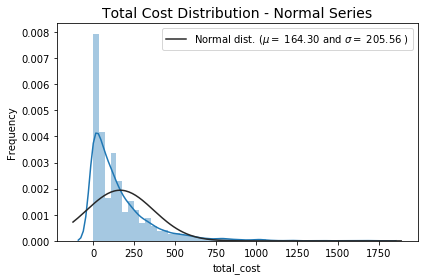

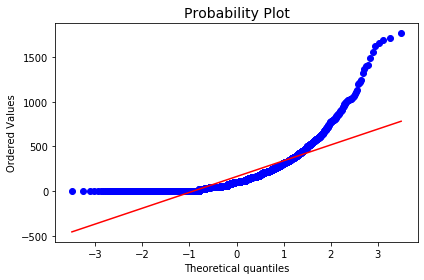

In [7]:
df = pd.DataFrame(df_household,columns=var_to_predict)

sns.distplot(df[var_to_predict[0]] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df[var_to_predict[0]])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Total Cost Distribution - Normal Series')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df[var_to_predict[0]], plot=plt)
plt.show()


 mu = 3.90 and sigma = 2.18



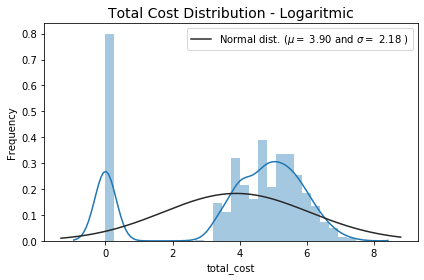

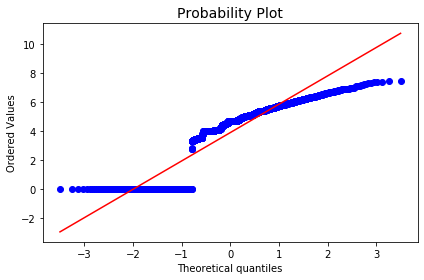

In [8]:
# Logaritmic
df = pd.DataFrame(df_household,columns=var_to_predict)

df[var_to_predict[0]] = np.log1p(df[var_to_predict[0]])

sns.distplot(df[var_to_predict[0]] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df[var_to_predict[0]])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Total Cost Distribution - Logaritmic')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df[var_to_predict[0]], plot=plt)
plt.show()


 mu = -0.00 and sigma = 1.00



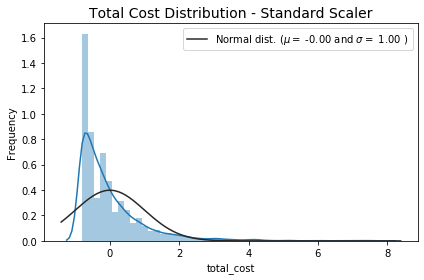

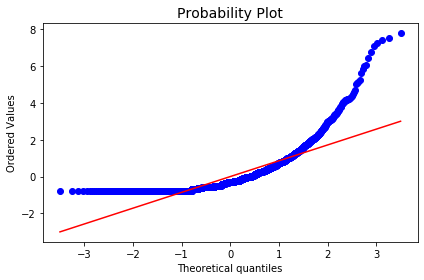

In [9]:
# Standard Scaler

df = pd.DataFrame(df_household,columns=var_to_predict)
scaler = StandardScaler()
scaled_df = scaler.fit_transform(df)
scaled_df = pd.DataFrame(scaled_df, columns=df.columns)

df = scaled_df.copy()
sns.distplot(df[var_to_predict[0]] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df[var_to_predict[0]])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Total Cost Distribution - Standard Scaler')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df[var_to_predict[0]], plot=plt)
plt.show()


 mu = 0.09 and sigma = 0.12



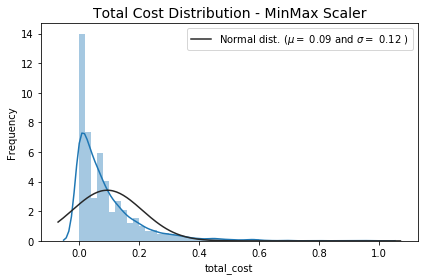

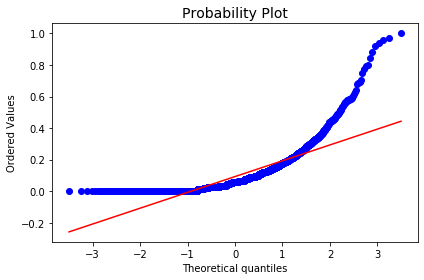

In [10]:
# MinMax Scaler

df = pd.DataFrame(df_household,columns=var_to_predict)
scaler = MinMaxScaler()
scaled_df = scaler.fit_transform(df)
scaled_df = pd.DataFrame(scaled_df, columns=df.columns)

df = scaled_df.copy()
sns.distplot(df[var_to_predict[0]] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df[var_to_predict[0]])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Total Cost Distribution - MinMax Scaler')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df[var_to_predict[0]], plot=plt)
plt.show()


 mu = 0.30 and sigma = 1.06



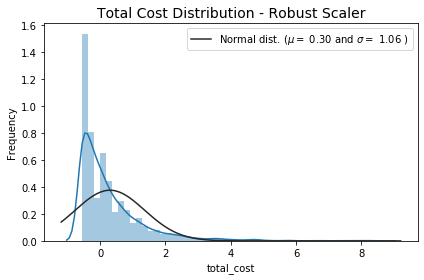

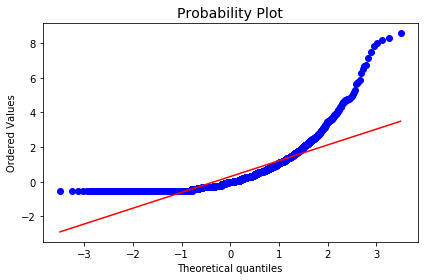

In [11]:
# Robust Scaler

df = pd.DataFrame(df_household,columns=var_to_predict)
scaler = RobustScaler()
scaled_df = scaler.fit_transform(df)
scaled_df = pd.DataFrame(scaled_df, columns=df.columns)

df = scaled_df.copy()
sns.distplot(df[var_to_predict[0]] , fit=norm)

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df[var_to_predict[0]])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Total Cost Distribution - Robust Scaler')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df[var_to_predict[0]], plot=plt)
plt.show()


 mu = -0.00 and sigma = 1.00



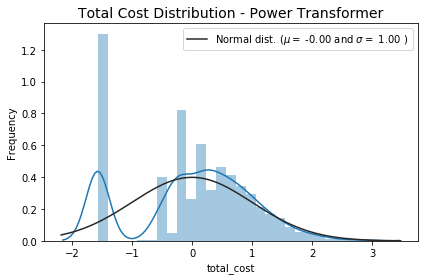

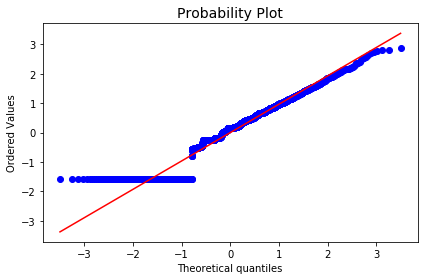

In [12]:
# Power Transformer

df = pd.DataFrame(df_household,columns=var_to_predict)
scaler = PowerTransformer()
scaled_df = scaler.fit_transform(df)
scaled_df = pd.DataFrame(scaled_df, columns=df.columns)

df = scaled_df.copy()
sns.distplot(df[var_to_predict[0]] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df[var_to_predict[0]])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Total Cost Distribution - Power Transformer')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df[var_to_predict[0]], plot=plt)
plt.show()


 mu = 0.79 and sigma = 0.41



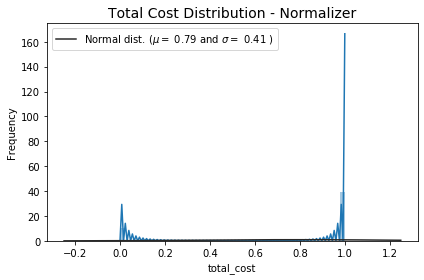

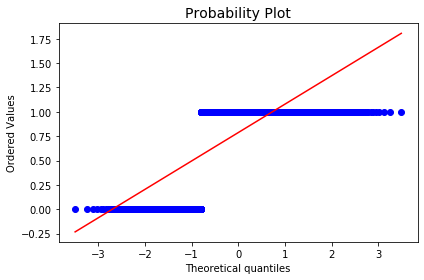

In [13]:
# Normalizer Transformer

df = pd.DataFrame(df_household,columns=var_to_predict)
scaler = Normalizer()
scaled_df = scaler.fit_transform(df)
scaled_df = pd.DataFrame(scaled_df, columns=df.columns)

df = scaled_df.copy()
sns.distplot(df[var_to_predict[0]] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df[var_to_predict[0]])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Total Cost Distribution - Normalizer')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df[var_to_predict[0]], plot=plt)
plt.show()


 mu = 0.09 and sigma = 0.12



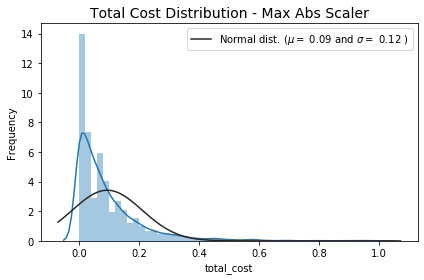

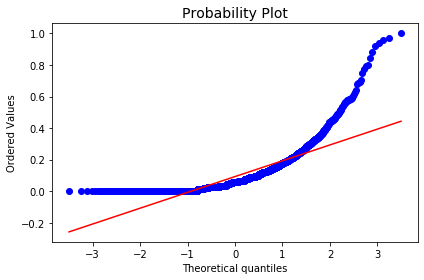

In [14]:
# Max Abs transformer

df = pd.DataFrame(df_household,columns=var_to_predict)
scaler = MaxAbsScaler()
scaled_df = scaler.fit_transform(df)
scaled_df = pd.DataFrame(scaled_df, columns=df.columns)

df = scaled_df.copy()
sns.distplot(df[var_to_predict[0]] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df[var_to_predict[0]])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Total Cost Distribution - Max Abs Scaler')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df[var_to_predict[0]], plot=plt)
plt.show()


 mu = 0.48 and sigma = 0.32



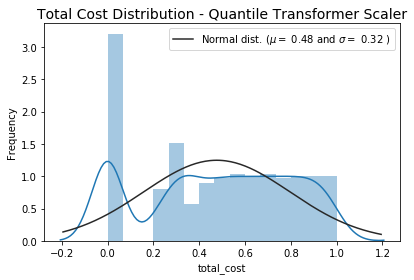

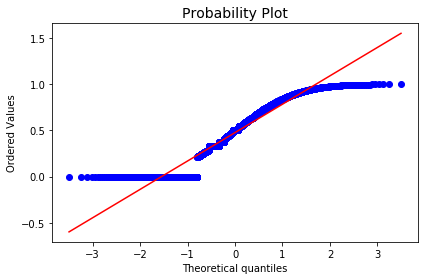

In [15]:
# Quantile Transformer Scaler

df = pd.DataFrame(df_household,columns=var_to_predict)
scaler = QuantileTransformer(1000,'uniform')
scaled_df = scaler.fit_transform(df)
scaled_df = pd.DataFrame(scaled_df, columns=df.columns)

df = scaled_df.copy()
sns.distplot(df[var_to_predict[0]] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df[var_to_predict[0]])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Total Cost Distribution - Quantile Transformer Scaler')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df[var_to_predict[0]], plot=plt)
plt.show()

# Cars that are most likely to break down 
https://247wallst.com/special-report/2019/12/12/these-new-cars-are-most-likely-to-break-down/2/

# Top Car 35 Car brand according to consumer reports
https://www.autonews.com/retail/subaru-reaches-top-consumer-reports-rankings-tesla-falters


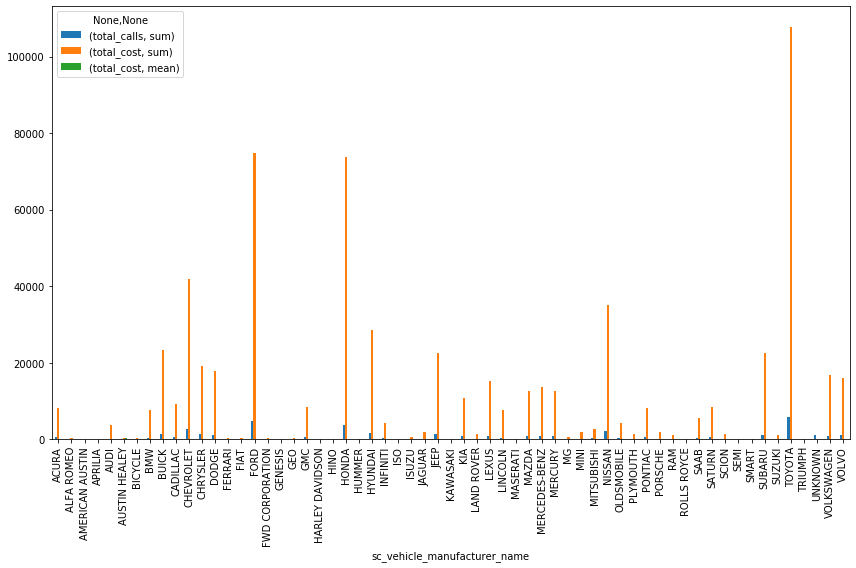

In [20]:
df_group_veh_manuf = df_transaction.groupby(by='sc_vehicle_manufacturer_name').agg(({'total_calls':sum, 
                                                                                     'total_cost' :['sum','mean']
                                                                                    })).plot(kind='bar')

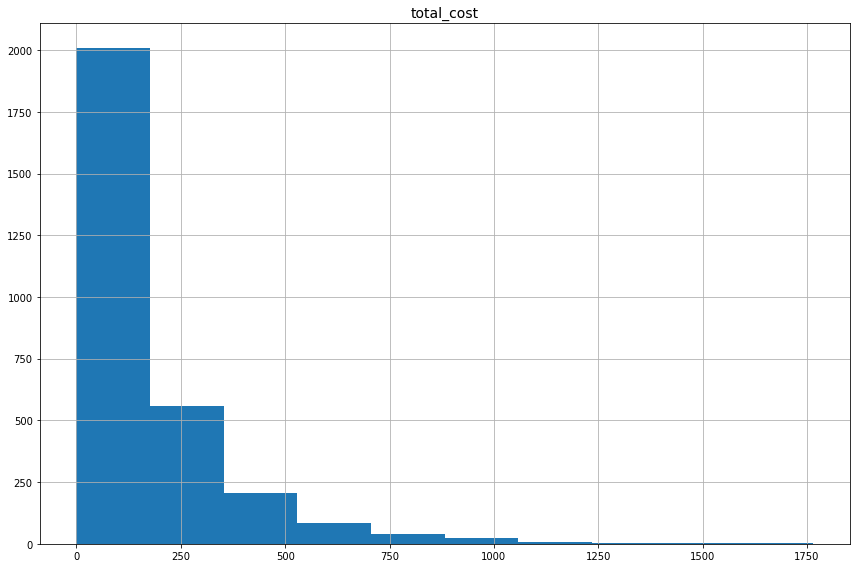

In [21]:
df_household[var_to_predict].hist(figsize=(12,8))
plt.show()

In [22]:
# Gender
fig = px.scatter(df_household, x=var_to_predict[0], y="total_calls", marginal_x="box", 
                 marginal_y="box", trendline="ols", facet_col="gender",color="gender",
                 color_continuous_scale=px.colors.sequential.Viridis, render_mode="webgl"
                )
fig.show()


In [23]:
# Gender
fig = px.scatter(df_household, x=var_to_predict[0], y="total_calls", marginal_x="box", 
                 marginal_y="box", trendline="ols", color="tenure",facet_col="gender",
                 color_continuous_scale=px.colors.sequential.Viridis, render_mode="webgl"
                )
fig.show()


In [24]:
df_transaction.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21343 entries, 0 to 21342
Data columns (total 166 columns):
individual_key                    int64
household_key                     int64
member_flag                       int64
city                              object
state_grouped                     object
zip5                              int64
zip9                              int64
fsv_cmsi_flag                     int64
fsv_credit_card_flag              int64
fsv_deposit_program_flag          int64
fsv_home_equity_flag              int64
fsv_id_theft_flag                 int64
fsv_mortgage_flag                 int64
ins_client_flag                   int64
trv_globalware_flag               int64
number_of_children                object
responded_to_catalog              object
race                              object
length_of_residence               int64
mail_responder                    object
home_owner                        object
income                            object
da

In [25]:
df_household.groupby(by=var_to_predict[0]).mean()

,membership_id,household_key,zip,aaa_no_tenure,aaa_member_tenure_years,aaa_mean_age,length_of_residence,aaa_mortgage,aaa_credit_card,aaa_deposit,aaa_home_equity,aaa_financial_service,aaa_auto_insurance,aaa_id_theft,aaa_motorcycle_indicator,aaa_travel,aaa_mean_child,aaa_mean_total_cost,aaa_no_race,aaa_no_home_owner,aaa_no_education,aaa_no_income,aaa_no_dwelling_type,aaa_no_credit_ranges,aaa_no_gender,aaa_no_language,aaa_no_reason_joined,aaa_cancel_reason,aaa_no_mosaic_household,aaa_no_mosaic_global_household,aaa_no_kcl_b_ind_mosaicsgrouping,aaa_no_occupation_code,aaa_no_occupation_group,aaa_no_occupant_type,aaa_no_plus_indicator_description,aaa_no_generation,total_calls_year_1,total_calls_year_2,total_calls_year_3,total_member_cost_1,total_member_cost_2,total_member_cost_3,basic_cost,plus_cost,premier_cost,mean_basic_cost,mean_plus_cost,mean_premier_cost,total_calls,total_member_cost,mean_total_member_cost,total_tow_miles,mean_tow_miles,mean_total_cost,total_members_in_household,total_calls_veh,total_cost_veh,total_member_cost_veh,mean_total_calls_veh,mean_total_cost_veh,mean_total_member_cost_veh,consumer_score,use_road_side,aaa_cancel
total_cost,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.0000,117957.3014,14726206.0016,2885.3748,0.9649,46.8788,74.8219,7.7364,0.0526,0.1244,0.0128,0.0016,0.0526,0.2775,0.0622,0.4762,0.1722,1.5088,0.0000,2.4303,0.0595,1.9946,4.7362,0.4064,2.4691,1.5227,0.0950,3.2000,3.6354,8.4660,2.7809,3.8553,7.1593,4.9018,1.3158,1.1379,0.6270,0.0223,0.1643,0.3158,0.8175,8.4238,15.2335,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.5024,24.4748,14.3392,0.0000,0.0000,0.0000,1.9633,1253.7337,1672.7186,64406.7857,0.2734,1.9318,14.1053,0.0149,0.3206,0.0000
15.0000,377560.6667,6438447.3333,4076.0000,0.3333,54.0000,68.4445,7.2222,0.0000,0.3333,0.0000,0.0000,0.0000,0.0000,0.0000,0.6667,0.0000,1.3333,5.4167,3.3333,0.0000,2.0000,5.6667,1.3333,2.0000,2.0000,0.0000,nan,5.0000,19.3333,5.0000,9.0000,9.0000,9.0000,1.0000,0.6667,2.3333,0.0000,0.0000,0.6667,0.0000,0.0000,35.3333,15.0000,0.0000,0.0000,5.4167,0.0000,0.0000,0.6667,35.3333,17.6667,0.0000,0.0000,5.4167,2.6667,2394.6667,44094.2067,127211.2800,2.6394,47.1911,139.0196,0.0149,0.3333,0.0000
16.2500,16706.0000,2128311.0000,2864.0000,4.0000,46.0000,59.0000,3.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,1.0000,3.2500,2.0000,0.0000,nan,1.0000,0.0000,1.0000,1.0000,0.0000,nan,6.0000,8.0000,2.0000,2.0000,6.0000,4.0000,nan,0.0000,3.0000,2.0000,2.0000,0.0000,156.5400,62.5000,0.0000,16.2500,0.0000,0.0000,3.2500,0.0000,0.0000,4.0000,219.0400,43.8080,0.0000,0.0000,3.2500,5.0000,2726.0000,41960.3900,142165.7600,2.8938,44.5439,150.9191,0.0164,1.0000,0.0000
26.0000,205566.2500,17542385.2500,2832.7500,1.7500,47.0000,69.8750,3.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.2500,0.2500,0.0000,0.5000,2.6667,13.0000,2.0000,0.0000,2.0000,4.6667,0.0000,2.3333,2.0000,0.0000,nan,1.0000,19.0000,3.0000,6.0000,7.0000,4.0000,nan,0.5000,1.2500,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,26.0000,0.0000,0.0000,13.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,13.0000,2.0000,3523.5000,53892.8300,182629.3900,1.3565,23.5260,70.4061,0.0143,0.0000,0.0000
26.5000,56190.0000,7721834.0000,2806.0000,1.0000,31.0000,52.0000,12.3333,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,2.0000,8.8333,1.0000,0.0000,1.0000,13.0000,0.0000,4.0000,2.0000,0.0000,nan,nan,18.0000,2.0000,7.0000,26.0000,16.0000,nan,0.0000,3.0000,0.0000,0.0000,1.0000,0.0000,0.0000,58.8500,26.5000,0.0000,0.0000,8.8333,0.0000,0.0000,1.0000,58.8500,19.6167,0.0000,0.0000,8.8333,3.0000,3761.0000,73715.1100,203391.9500,2.5107,49.2090,135.7757,0.0143,1.0000,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1622.7000,226007.0000,2765930.0000,2809.0000,3.0000,57.0000,47.2000,2.6923,0.000

In [26]:
fig = px.scatter(df_household, x=var_to_predict[0], y="total_calls", size="total_calls", color="generation",
           hover_name="plus_indicator_description", log_x=True, size_max=60)
fig.show()

In [27]:
fig = px.bar(df_household, x='income', y=var_to_predict[0],
             hover_data=["plus_indicator_description", 'gender'], color="plus_indicator_description",
             labels={'total_calls':'Total Roadside Calls'}, height=600)
fig.show()

In [ ]:
# Number of members in household key
df_household.total_members_in_household.value_counts()

In [34]:
# Number of members

df_household['no_members'] = ' '
df_household['no_members']=np.where(df_household['total_members_in_household']== 1, '1 - MEMBER', 
                                    df_household['no_members'])
df_household['no_members']=np.where(df_household['total_members_in_household']== 2, '2 - MEMBER', 
                                    df_household['no_members'])
df_household['no_members']=np.where(df_household['total_members_in_household']== 3, '3 - MEMBER', 
                                    df_household['no_members'])
df_household['no_members']=np.where(df_household['total_members_in_household']== 4, '4 - MEMBER', 
                                    df_household['no_members'])

df_household['no_members']=np.where(df_household['total_members_in_household']> 4, '5 - MEMBER', 
                                    df_household['no_members'])
group5 = np.arange(5,20,1)
for i in group5:
    df_household['no_members']=np.where(df_household['total_members_in_household']== i, '+5 - MEMBER', 
                                    df_household['no_members'])

fig = px.box(df_household, x='no_members', y=var_to_predict[0], 
             labels={'no_members':'Total Members in Household', 'total_cost':'Total Cost'},
             title = 'Total Cost by Total Members in Household'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_no_members.png')
fig.show()

In [32]:
# Income
df_household.income.value_counts()

40 - 99,999     1067
100k+            815
UNKNOWN          715
UNDER 39,999     340
Name: income, dtype: int64

# Outcomes
The frequency of id theft Service use depend heavvily on income. 
Will consolidate income in three categories: 
    * a) under 10k - 39999: Under 39.999
    * b) 40 - 99,999 : 40 - 99,999
    * c) 100k and above : 100+
    

In [35]:
group1 = ['UNDER 10K', '10-19,999','20-29,999', '30-39,999']
group2 = ['40-49,999', '50-59,999', '60-69,999', '70-79,999', '80-89,999', '90-99,999']
group3 = ['100-149,999', '150 - 174,999', '175 - 199,999', '200 - 249,999', '250K+' ]
for i in group1:
    df_household['income']=np.where(df_household['income']== i, 'UNDER 39,999', df_household['income'])
for i in group2:
    df_household['income']=np.where(df_household['income']== i, '40 - 99,999', df_household['income'])
for i in group3:
    df_household['income']=np.where(df_household['income']== i, '100k+', df_household['income'])

fig = px.box(df_household, x='income', y=var_to_predict[0], 
             labels={'income':'Income', 'total_cost':'Total Cost'},
             title = 'Total Cost by Income Group'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_income.png')
fig.show()    

In [ ]:
# Tenures
df_household.tenure.value_counts()

# Outcomes
The frequency of id theft Service use depend heavily on tenures. Will consolidate tenure in three categories: 
    * a) above 40 years  
    * b) between 21 - 40 
    * c) Less 21 


In [36]:
group1 = ['BETWEEN 6 & 10 YEARS', 'BETWEEN 11 & 15 YEARS', 
          'BETWEEN 16 & 20 YEARS', 'BETWEEN 1 & 5 YEARS', '< 1 YEAR']
group2 = ['BETWEEN 31 & 40 YEARS', 'BETWEEN 21 & 30 YEARS']
group3 = ['+40 YEARS']
for i in group1:
    df_household['tenure']=np.where(df_household['tenure']== i, 'UNDER 20 YEARS', df_household['tenure'])
for i in group2:
    df_household['tenure']=np.where(df_household['tenure']== i, 'BETWEEN 21 & 40 YEARS', df_household['tenure'])
for i in group3:
    df_household['tenure']=np.where(df_household['tenure']== i, '+40 YEARS', df_household['tenure'])

fig = px.box(df_household, x='tenure', y=var_to_predict[0], 
             labels={'tenure':'Tenures', 'total_cost':'Total Cost'},
             title = 'Total Cost by Tenures Group'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_tenures.png')
fig.show()

In [ ]:
# Credit Ranges
df_household.credit_ranges.value_counts()

# Outcomes
The frequency of id theft Service use depend heavily on credit_ranges. Will consolidate tenure in three categories: 
    * a) above 800 
    * b) between 700 - 799 
    * c) Below 700

In [37]:
group1 = ['499 & LESS', '500-549','550-599','600-649', '650-699']
group2 = ['700-749', '750-799']
group3 = ['800+']
for i in group1:
    df_household['credit_ranges']=np.where(df_household['credit_ranges']== i, 'BELOW 700', df_household['credit_ranges'])
for i in group2:
    df_household['credit_ranges']=np.where(df_household['credit_ranges']== i, 'BETWEEN 700 & 799', df_household['credit_ranges'])
for i in group3:
    df_household['credit_ranges']=np.where(df_household['credit_ranges']== i, '800+', df_household['credit_ranges'])

fig = px.box(df_household, x='credit_ranges', y=var_to_predict[0], 
             labels={'credit_ranges':'Credit Ranges', 'total_cost':'Total Cost'},
             title = 'Total Cost by Credit Ranges'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_credit_ranges.png')
fig.show()

In [ ]:
# Education
df_household.education.value_counts()

# Outcomes
The frequency of id theft Service use depend heavily on education. Will consolidate graduate with completed collegue

In [38]:
# graph education
df_household['education']=np.where(df_household['education'] =='GRADUATED SCHOOL', 
                                   'COMPLETED COLLEGE', df_household['education']
                                  )
fig = px.box(df_household, x='education', y=var_to_predict[0], 
             labels={'education':'Education', 'total_cost':'Total Cost'},
             title = 'Total Cost by Education'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_education.png')
fig.show()

In [39]:
# Generation
df_household.generation.value_counts()

POST-WAR (< 1948)             1817
BABY BOOMERS (1948 - 1968)     805
GENERATION X (1969 - 1980)     141
MILLENIALS (1981 - 1993)       112
UNKNOWN                         51
GENERATION Z (1994 - 2010)      11
Name: generation, dtype: int64

In [40]:
fig = px.box(df_household, x='generation', y=var_to_predict[0], 
             labels={'generation':'Generation', 'total_cost':'Total Cost'},
             title = 'Total Cost by Generation'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_generation.png')
fig.show()

In [41]:
# Race
df_household.race.value_counts()

CAUCASION / WHITE - EUROPEAN              1000
UNKNOWN                                    755
CAUCASION / WHITE - ENGLISH                544
CAUCASION / WHITE - WHITE NON-AMERICAN     194
CAUCASION / WHITE - UNKNOWN                 93
MIDDLE EASTERN - ARAB                       80
HISPANIC - HISPANIC ORIGIN                  68
HISPANIC - PORTUGUESE ORIGIN                63
CAUCASION / WHITE - EASTERN EUROPEAN        63
ASIAN - CHINESE                             16
CAUCASION / WHITE - JEWISH                  15
CAUCASION / WHITE - GREEK                   13
ASIAN - UNKNOWN                              9
AFRICAN AMERICAN - AFRICAN ORIGIN            7
ASIAN - INDIAN                               5
AMERICAN INDIAN                              4
ASIAN - JAPANESE                             4
MIDDLE EASTERN - EGYPTIAN                    3
ASIAN - ORIENTAL                             1
Name: race, dtype: int64

# Observations
The frequency of id theft Service use depend heavily on race being caucasion- white group the predominant. 
I Will consolidate them in more similar groups
    * a) Caucasion - White
    * b) Hispanic
    * c) Asian
    * d) Arabs
    * e) America Africans / Indians

In [42]:
group1 = ['CAUCASION / WHITE - EUROPEAN', 'CAUCASION / WHITE - ENGLISH', 'CAUCASION / WHITE - WHITE NON-AMERICAN',
          'CAUCASION / WHITE - UNKNOWN', 'CAUCASION / WHITE - EASTERN EUROPEAN', 'CAUCASION / WHITE - JEWISH',
          'CAUCASION / WHITE - GREEK', 'CAUCASION / WHITE - DUTCH'
         ]
group2 = ['HISPANIC - HISPANIC ORIGIN', 'HISPANIC - PORTUGUESE ORIGIN']
group3 = ['ASIAN - CHINESE', 'ASIAN - UNKNOWN', 'ASIAN - JAPANESE', 'ASIAN - INDIAN', 'ASIAN - ORIENTAL']
group4 = ['MIDDLE EASTERN - ARAB', 'MIDDLE EASTERN - EGYPTIAN']
group5 = ['AFRICAN AMERICAN - AFRICAN ORIGIN', 'AMERICAN INDIAN']

for i in group1:
    df_household['race']=np.where(df_household['race']== i, 'CAUCASION / WHITE', df_household['race'])
for i in group2:
    df_household['race']=np.where(df_household['race']== i, 'HISPANIC', df_household['race'])
for i in group3:
    df_household['race']=np.where(df_household['race']== i, 'ASIAN', df_household['race'])
for i in group4:
    df_household['race']=np.where(df_household['race']== i, 'ARABS', df_household['race'])
for i in group5:
    df_household['race']=np.where(df_household['race']== i, 'AMERICAN AFRICANS / INDIANS', df_household['race'])
    
fig = px.box(df_household, x='race', y=var_to_predict[0], 
             labels={'race':'Race', 'total_cost':'Total Cost'},
             title = 'Total Cost by Race'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_race.png')
fig.show()

In [ ]:
# Home Owner
df_household.home_owner.value_counts()

# Outcomes
The frequency of id theft Service use depend heavily on home_owner.  Will leave consolidate probable renter with RENTER and probable home owner with home owner 

In [43]:
# Home Owner
df_household['home_owner']=np.where(df_household['home_owner']== 'PROBABLE RENTER', 'RENTER', df_household['home_owner'])
df_household['home_owner']=np.where(df_household['home_owner']== 'PROBABLE HOME OWNER', 'HOME OWNER', df_household['home_owner'])

fig = px.box(df_household, x='home_owner', y=var_to_predict[0], 
             labels={'home_owner':'Home Owner', 'total_cost':'Total Cost'},
             title = 'Total Cost by Home Owner Group'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_home_owner.png')
fig.show()

In [44]:
# Cancel reason
df_household.cancel_reason.value_counts()

UNKNOWN    2937
Name: cancel_reason, dtype: int64

# Observation
This Cancel Reason feature does not seems to be important to weather member choose or not id theft. Even though, for instance those member that their suscription was cancelled or CC rejected, there might be an oportunity to get a CC if credit is available to them.  Will consolidate the reason in three main groups:
* a) PAYMENT ISSUES
* b) MEMBER ISSUES
* c) DATA/AAA ISSUES

UKNOWN will be replaced by 'NOT CANCELLED'  It is the largest group and a potential to customer.

In [47]:
group1 = ['NON-PAYMENT', 'ERS DECLINE CC', 'BAD ADD SET BY PO ACS', '*BAD CHECKS*', 
         ]
group2 = ['DECEASED', 'NO LONGER DRIVING', 'MEMBERS REQUEST', 'CANCELLED DO NOT RENEW', 'TRANSFER MEMBER',
          'DO NOT RENEW', 'MOVED OUT OF TERR', 'TRANSFER MEMBER SUSPEND', 'CANCELLED MBRS REQUEST',
          'HEALTH ISSUE', 'NONCOMPLIANT AGE', 'PO RETURN'
         ]
group3 = ['DATA PROBLEM','DUP MEMBERSHIP','ERS CNCL MSHIP PROGRAM','MANAGEMENT REQUEST', 'CANCEL PROCESS - FUTURE CANCEL DNR']

for i in group1:
    df_household['cancel_reason']=np.where(df_household['cancel_reason']== i, 'PAYMENT ISSUES', df_household['cancel_reason'])
for i in group2:
    df_household['cancel_reason']=np.where(df_household['cancel_reason']== i, 'MEMBER ISSUES', df_household['cancel_reason'])
for i in group3:
    df_household['cancel_reason']=np.where(df_household['cancel_reason']== i, 'DATA/AAA ISSUES', df_household['cancel_reason'])

df_household['cancel_reason']=np.where(df_household['cancel_reason']== 'UNKNOWN', 'NOT CANCELLED', df_household['cancel_reason'])



In [46]:
# mosaic_household
df_household.mosaic_household.value_counts()

UNKNOWN                       706
AGING IN PLACE                509
SILVER SOPHISTICATES          228
REAPING REWARDS               169
NO PLACE LIKE HOME            142
TOWN ELDERS                   138
ROOTED FLOWER POWER           120
AGING OF AQUARIUS              92
SENIOR DISCOUNTS               92
SETTLED IN SUBURBIA            79
FULL POCKETS  EMPTY NESTS      61
BLUE COLLAR COMFORT            42
PLATINUM PROSPERITY            38
PROGRESSIVE POTPOURRI          35
BOHEMIAN GROOVE                33
AMERICAN ROYALTY               32
DIGITAL DEPENDENTS             32
FAMILY FUN-TASTIC              30
GOLF CARTS AND GOURMETS        27
BIRKENSTOCKS AND BEEMERS       23
UNSPOILED SPLENDOR             23
BOOMERS AND BOOMERANGS         22
FAST TRACK COUPLES             21
PICTURE PERFECT FAMILIES       20
MID-SCALE MEDLEY               19
STATUS SEEKING SINGLES         19
GENERATIONAL SOUP              16
SETTLED AND SENSIBLE           16
COLLEGES AND CAFES             16
STOCKCARS AND 

In [48]:
fig = px.box(df_household, x='mosaic_household', y=var_to_predict[0], 
             labels={'mosaic_household':'Mosaic household', 'total_cost':'Total Cost'},
             title = 'Total Cost by Mosaic Household'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_mosaic_household.png')
fig.show()

In [49]:
# mosaic_household
df_household.mosaic_global_household.value_counts()

COMFORTABLE RETIREMENT       843
UNKNOWN                      706
BOURGEOIS PROSPERITY         510
ROUTINE SERVICE WORKERS      313
POST INDUSTRIAL SURVIVORS    125
HARD WORKING BLUE COLLAR     122
LOW INCOME ELDERS            112
CAREER AND FAMILY            110
METROPOLITAN STRUGGLERS       70
SOPHISTICATED SINGLES         25
RURAL INHERITANCE              1
Name: mosaic_global_household, dtype: int64

# Observation
Reviewing the graph above, these three groups can be consolidated in:
* a) METROPOLITAN STRUGGLERS into ROUTINE SERVICE WORKERS
* b) SOPHISTICATED SINGLES into BOURGEOIS PROSPERITY
* c) RURAL INHERITANCE into CAREER AND FAMILY
* d) POST INDUSTRIAL SURVIVORS into ROUTINE SERVICE WORKERS

In [50]:
df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'METROPOLITAN STRUGGLERS', 
                                                 'ROUTINE SERVICE WORKERS', df_household['mosaic_global_household']
                                                )

df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'SOPHISTICATED SINGLES', 
                                                 'BOURGEOIS PROSPERITY', df_household['mosaic_global_household']
                                                )

df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'RURAL INHERITANCE', 
                                                 'CAREER AND FAMILY', df_household['mosaic_global_household']
                                                )
df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'POST INDUSTRIAL SURVIVORS', 
                                                 'ROUTINE SERVICE WORKERS', df_household['mosaic_global_household']
                                                )
fig = px.box(df_household, x='mosaic_global_household', y=var_to_predict[0], 
             labels={'mosaic_global_household':'Mosaic Global Household', 'total_cost':'Total Cost'},
             title = 'Total Cost by Mosaic Global Household Group'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_mosaic_global_household.png')
fig.show()

In [ ]:
# kcl_b_ind_mosaicsgrouping
df_household.kcl_b_ind_mosaicsgrouping.value_counts()

# Observation
Reviewing the graph above, there are five dominant group here
* a) GOLDEN YEARS - retired people
* b) BOOMING - well established families
* c) POWER ELITE - powerufull wealth people
* d) FAMILY - middle class families
* e) Singles - singles or single moms.

In [51]:
group1 = ['AUTUMN YEARS', 'GOLDEN YEAR GUARDIANS']
group2 = ['BOOMING WITH CONFIDENCE', 'THRIVING BOOMERS', 'BLUE SKY BOOMERS']
group3 = ['POWER ELITE', 'SURBURBAN STYLE', 'FLOURISHING FAMILIES']
group4 = ['FAMILY UNION', 'MIDDLE CLASS MELTING POT', 'PROMISING FAMILIES', 'ECONOMIC CHALLENGES', 'FAMILIES IN MOTION',
          'PASTORAL PRIDE']
group5 = ['SINGLES AND STARTERS', 'SIGNIFICANT SINGLES', 'YOUNG CITY SOLOS', 'CULTURAL CONNECTIONS',
         'ASPIRATIONAL FUSION']
for i in group1:
    df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'GOLDEN YEAR', df_household['kcl_b_ind_mosaicsgrouping'])
for i in group2:
    df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'BOOMERS', df_household['kcl_b_ind_mosaicsgrouping'])
for i in group3:
    df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'POWER ELITE', df_household['kcl_b_ind_mosaicsgrouping'])
for i in group4:
    df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'MIDDLE CLASS MELTING POT', df_household['kcl_b_ind_mosaicsgrouping'])
for i in group5:
    df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'SINGLES AND STARTERS', df_household['kcl_b_ind_mosaicsgrouping'])

fig = px.box(df_household, x='kcl_b_ind_mosaicsgrouping', y=var_to_predict[0], 
             labels={'kcl_b_ind_mosaicsgrouping':' Experian Mosaic Group', 'total_cost':'Total Cost'},
             title = 'Total Cost by Experian Mosaic Group'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_kcl_b_ind_mosaicsgrouping.png')
fig.show()

In [52]:
# Vehicle Manufacturer
df_household.sc_vehicle_manufacturer_name.value_counts()

UNKNOWN            874
TOYOTA             360
FORD               247
HONDA              234
CHEVROLET          154
NISSAN             106
HYUNDAI            105
BUICK               91
SUBARU              75
DODGE               60
JEEP                52
CHRYSLER            50
LEXUS               48
MERCEDES-BENZ       42
VOLKSWAGEN          40
MERCURY             38
MAZDA               38
KIA                 38
CADILLAC            33
VOLVO               28
ACURA               27
BMW                 26
LINCOLN             25
GMC                 24
SATURN              23
PONTIAC             22
AUDI                14
INFINITI            13
SAAB                10
OLDSMOBILE           7
MINI                 6
SCION                5
LAND ROVER           5
PLYMOUTH             4
FIAT                 3
MITSUBISHI           3
JAGUAR               2
HARLEY DAVIDSON      1
AMERICAN AUSTIN      1
ISUZU                1
GEO                  1
PORSCHE              1
Name: sc_vehicle_manufacturer_name

# Observation
Reviewing the graph above, there are four main group of car.  

* a) Standard for small families, and young professional, 
* b) Middle End - Middle class families and middle management
* c) High End - Success and upper management or people above 55 years no debts and no kids at school

Going to group the vehicle manufacturer in those three groups.

In [53]:
group1 = [ 'TOYOTA', 'FORD', 'HONDA', 'CHEVROLET', 'HYUNDAI', 'NISSAN', 'BUICK', 'SUBARU', 'SUZUKI',
         'DODGE', 'CHRYSLER', 'VOLKSWAGEN','KIA', 'MAZDA', 'SATURN', 'PONTIAC', 'SCION', 'MITSUBISHI',
          'GEO', 'CRYSLER', 'MG', 'FIAT', 'BICYCLE', 'ISUZU']
group2 = ['JEEP', 'MERCURY','GMC', 'OLSMOBILE', 'RAM', 'PLYMOUTH', 'GENESIS', 'OLDSMOBILE', 'AMERICAN AUSTIN']
          
group3 = ['LEXUS', 'VOLVO', 'MERCEDES-BENZ', 'CADILLAC','LINCOLN', 'ACURA', 'BMW', 'SAAB', 'AUDI', 'INFINITI',
          'LAND ROVER', 'MINI', 'JAGUAR', 'PORSCHE', 'HARLEY DAVIDSON', 'ALFA ROMEO']

for i in group1:
    df_household['sc_vehicle_manufacturer_name']=np.where(df_household['sc_vehicle_manufacturer_name']== i, 'STANDARD END VEHICLE', df_household['sc_vehicle_manufacturer_name'])
for i in group2:
    df_household['sc_vehicle_manufacturer_name']=np.where(df_household['sc_vehicle_manufacturer_name']== i, 'MIDDLE END VEHICLE', df_household['sc_vehicle_manufacturer_name'])
for i in group3:
    df_household['sc_vehicle_manufacturer_name']=np.where(df_household['sc_vehicle_manufacturer_name']== i, 'LUXURY VEHICLE', df_household['sc_vehicle_manufacturer_name'])

fig = px.box(df_household, x='sc_vehicle_manufacturer_name', y=var_to_predict[0], 
             labels={'sc_vehicle_manufacturer_name':'Vehicle Manufacturer', 'total_cost':'Total Cost'},
             title = 'Total Cost by Vehicle Manufacturer'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_sc_vehicle_manufacturer_name.png')
fig.show()

In [54]:
# Occupation Code
df_household.occupation_code.value_counts()

UNKNOWN                            2149
RETIRED                             186
PROFESSIONAL/TECHNICAL              101
UPPER MANAGEMENT/EXECUTIVE           72
NURSE                                71
CLERICAL/OFFICE                      50
TEACHER/EDUCATOR                     49
MIDDLE MANAGEMENT                    49
SKILLEDTRADE/MACHINE/LABORER         44
SALES/MARKETING                      25
BEAUTY                               18
REAL ESTATE                          13
SELF EMPLOYED                        12
EXECUTIVE/ADMINISTRATOR              10
ATTORNEYS                            10
HEALTH SERVICES                       9
PHARMACIST                            6
COUNSELORS                            6
PROFESSIONAL DRIVER                   6
COMPUTER PROFESSIONAL                 5
ENGINEERS                             5
RETAIL SALES                          4
OCCUPATIONAL THER/PHYSICAL THER       4
ACCOUNTANTS/CPA                       4
CIVIL SERVANT                         4


In [55]:
df_household.occupation_group.value_counts()

UNKNOWN                             1260
RETIRED - INFERRED                   557
PROFESSIONAL - KNOWN                 268
RETIRED - KNOWN                      186
MANAGEMENT - KNOWN                   138
MANAGEMENT - INFERRED                 75
OTHER - INFERRED                      57
OFFICE ADMINISTRATION - INFERRED      55
BLUE COLLAR - KNOWN                   51
OFFICE ADMINISTRATION - KNOWN         50
PROFESSIONAL - INFERRED               49
BLUE COLLAR - INFERRED                45
SALES - KNOWN                         42
OTHER - KNOWN                         39
TECHNICAL - INFERRED                  28
SALES - INFERRED                      23
TECHNICAL - KNOWN                     14
Name: occupation_group, dtype: int64

# Observation
Reviewing the graph above, there are 4 prodominat group
* a) PROFESSIONAL
* b) MANAGEMENT
* c) RETIRED
* d) OTHERS

In [56]:
group1 = ['PROFESSIONAL - KNOWN', 'PROFESSIONAL - INFERRED', 'OFFICE ADMINISTRATION - KNOWN',
         'SALES - KNOWN', 'OFFICE ADMINISTRATION - INFERRED', 'TECHNICAL - INFERRED',
         'SALES - INFERRED', 'TECHNICAL - KNOWN']
group2 = ['MANAGEMENT - KNOWN', 'BLUE COLLAR - KNOWN', 'MANAGEMENT - INFERRED', 'BLUE COLLAR - INFERRED']
group3 = ['RETIRED - INFERRED', 'RETIRED - KNOWN']
group4 = ['OTHER - INFERRED', 'OTHER - KNOWN']

for i in group1:
    df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'PROFESSIONAL', df_household['occupation_group'])
for i in group2:
    df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'MANAGEMENT', df_household['occupation_group'])
for i in group3:
    df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'RETIRED', df_household['occupation_group'])
for i in group4:
    df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'OTHER', df_household['occupation_group'])

fig = px.box(df_household, x='occupation_group', y=var_to_predict[0], 
             labels={'occupation_group':'Occupation Group', 'total_cost':'Total Cost'},
             title = 'Total Cost by Occupation Group'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_occupation_group.png')
fig.show()

In [57]:
# graph occupant type
df_household.occupant_type.value_counts()

UNKNOWN      2842
HOMEOWNER      64
RENTER         31
Name: occupant_type, dtype: int64

In [58]:
# graph member status
df_household.member_status.value_counts()

ACTIVE     2662
PENDING     275
Name: member_status, dtype: int64

In [60]:
fig = px.box(df_household, x='member_status', y=var_to_predict[0], 
             labels={'member_status':'Member Status', 'total_cost':'Total Cost'},
             title = 'Total Cost by Member Status'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_member_status.png')
fig.show()

In [61]:
# graph deposit
df_household.aaa_deposit.value_counts()

0    2917
1      20
Name: aaa_deposit, dtype: int64

In [62]:
fig = px.box(df_household, x='aaa_deposit', y=var_to_predict[0], 
             labels={'aaa_deposit':'Use Deposit Service', 'total_cost':'Total Cost'},
             title = 'Total Cost by Deposit Service Usage'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_aaa_deposit.png')
fig.show()

In [63]:
# graph Financial service
df_household.aaa_financial_service.value_counts()

0    2671
1     266
Name: aaa_financial_service, dtype: int64

In [65]:
fig = px.box(df_household, x='aaa_financial_service', y=var_to_predict[0], 
             labels={'aaa_financial_service':'Use Financial Service', 'total_cost':'Total Cost'},
             title = 'Total Cost by Financial Services Usage'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_aaa_financial.png')
fig.show()

In [ ]:
# graph home_equity
df_household.aaa_home_equity.value_counts()

In [68]:
fig = px.box(df_household, x='aaa_home_equity', y=var_to_predict[0], 
             labels={'aaa_home_equity':'Use Home Equity Service', 'total_cost':'Total Cost'},
             title = 'Total Cost by Home Equity Services Usage'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_aaa_home_equity.png')
fig.show()

In [ ]:
# graph mortgage
df_household.aaa_mortgage.value_counts()

In [66]:
fig = px.box(df_household, x='aaa_mortgage', y=var_to_predict[0], 
             labels={'aaa_mortgage':'Use Mortgage Service', 'total_cost':'Total Cost'},
             title = 'Total Cost by Mortgage Services Usage'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_aaa_mortgage.png')
fig.show()

In [ ]:
# graph credit card
df_household.aaa_credit_card.value_counts()

In [69]:
fig = px.box(df_household, x='aaa_credit_card', y=var_to_predict[0], 
             labels={'aaa_credit_card':'Use Credit Card Service', 'total_cost':'Total Cost'},
             title = 'Total Cost by Credit Card Services Usage'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_aaa_credit_card.png')
fig.show()

In [ ]:
# graph auto insurance
df_household.aaa_auto_insurance.value_counts()

In [70]:
fig = px.box(df_household, x='aaa_auto_insurance', y=var_to_predict[0], 
             labels={'aaa_auto_insurance':'Use Auto Insurance Service', 'total_cost':'Total Cost'},
             title = 'Total Cost by Auto Insurance Services Usage'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_aaa_auto_insurance.png')
fig.show()

In [ ]:
# graph id theft service
df_household.aaa_id_theft.value_counts()

In [71]:
fig = px.box(df_household, x='aaa_id_theft', y=var_to_predict[0], 
             labels={'aaa_id_theft':'Use ID Thefte Service', 'total_cost':'Total Cost'},
             title = 'Total Cost by ID Theft Services Usage'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_aaa_id_theft.png')
fig.show()

In [72]:
# graph travel service
df_household.aaa_travel.value_counts()

0    2383
1     554
Name: aaa_travel, dtype: int64

In [73]:
fig = px.box(df_household, x='aaa_travel', y=var_to_predict[0], 
             labels={'aaa_travel':'Use Travel Service', 'total_cost':'Total Cost'},
             title = 'Total Cost by Travel Services Usage'             
            )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_aaa_travel.png')
fig.show()

# Model to predict Roadside Service Usage by household key

# Final Observation (Need update)

Based on the previous anlysis, these are the most important feature:
* income
* tenure
* credit_ranges
* education
* generation
* race
* home_owner
* cancel_reason
* mosaic_global_household
* plus_indicator_description
* Gender
* kcl_b_ind_mosaicsgrouping
* sc_vehicle_manufacturer_name
* occupation_group


In [74]:
# Re initiate all features and data
def reiniciar(df_household):
    df_household = read_data('household_view.csv')
    
    # Regroup Group Income
    group1 = ['UNDER 10K','10-19,999' , '20-29,999', '30-39,999']
    group2 = ['40-49,999', '50-59,999', '60-69,999', '70-79,999', '80-89,999', '90-99,999']
    group3 = ['100-149,999', '150 - 174,999', '175 - 199,999', '200 - 249,999', '250K+' ]
    for i in group1:
        df_household['income']=np.where(df_household['income']== i, 'UNDER 39,999', df_household['income'])
    for i in group2:
        df_household['income']=np.where(df_household['income']== i, '40 - 99,999', df_household['income'])
    for i in group3:
        df_household['income']=np.where(df_household['income']== i, '100k+', df_household['income'])
    
    # Regroup tenures
    group1 = ['BETWEEN 6 & 10 YEARS', 'BETWEEN 11 & 15 YEARS', 
          'BETWEEN 16 & 20 YEARS', 'BETWEEN 1 & 5 YEARS', '< 1 YEAR']
    group2 = ['BETWEEN 31 & 40 YEARS', 'BETWEEN 21 & 30 YEARS']
    group3 = ['+40 YEARS']
    for i in group1:
        df_household['tenure']=np.where(df_household['tenure']== i, 'UNDER 20 YEARS', df_household['tenure'])
    for i in group2:
        df_household['tenure']=np.where(df_household['tenure']== i, 'BETWEEN 21 & 40 YEARS', df_household['tenure'])
    for i in group3:
        df_household['tenure']=np.where(df_household['tenure']== i, '+40 YEARS', df_household['tenure'])
    
    # Regroup credit ranges
    group1 = ['499 & LESS', '500-549','550-599','600-649', '650-699']
    group2 = ['700-749', '750-799']
    group3 = ['800+']
    for i in group1:
        df_household['credit_ranges']=np.where(df_household['credit_ranges']== i, 'BELOW 700', df_household['credit_ranges'])
    for i in group2:
        df_household['credit_ranges']=np.where(df_household['credit_ranges']== i, 'BETWEEN 700 & 799', df_household['credit_ranges'])
    for i in group3:
        df_household['credit_ranges']=np.where(df_household['credit_ranges']== i, '800+', df_household['credit_ranges'])
    
    # Regroup Education
    df_household['education']=np.where(df_household['education'] =='GRADUATED SCHOOL', 
                                   'COMPLETED COLLEGE', df_household['education']
                                  )
    # Regroup Race
    group1 = ['CAUCASION / WHITE - EUROPEAN', 'CAUCASION / WHITE - ENGLISH', 'CAUCASION / WHITE - WHITE NON-AMERICAN',
          'CAUCASION / WHITE - UNKNOWN', 'CAUCASION / WHITE - EASTERN EUROPEAN', 'CAUCASION / WHITE - JEWISH',
          'CAUCASION / WHITE - GREEK', 'CAUCASION / WHITE - DUTCH'
         ]
    group2 = ['HISPANIC - HISPANIC ORIGIN', 'HISPANIC - PORTUGUESE ORIGIN']
    group3 = ['ASIAN - CHINESE', 'ASIAN - UNKNOWN', 'ASIAN - JAPANESE', 'ASIAN - INDIAN', 'ASIAN - ORIENTAL']
    group4 = ['MIDDLE EASTERN - ARAB', 'MIDDLE EASTERN - EGYPTIAN']
    group5 = ['AFRICAN AMERICAN - AFRICAN ORIGIN', 'AMERICAN INDIAN']

    for i in group1:
        df_household['race']=np.where(df_household['race']== i, 'CAUCASION / WHITE', df_household['race'])
    for i in group2:
        df_household['race']=np.where(df_household['race']== i, 'HISPANIC', df_household['race'])
    for i in group3:
        df_household['race']=np.where(df_household['race']== i, 'ASIAN', df_household['race'])
    for i in group4:
        df_household['race']=np.where(df_household['race']== i, 'ARABS', df_household['race'])
    for i in group5:
        df_household['race']=np.where(df_household['race']== i, 'AMERICAN AFRICANS / INDIANS', df_household['race'])

    # Regroup Home Owner
    df_household['home_owner']=np.where(df_household['home_owner']== 'PROBABLE RENTER', 'RENTER', df_household['home_owner'])
    df_household['home_owner']=np.where(df_household['home_owner']== 'PROBABLE HOME OWNER', 'HOME OWNER', df_household['home_owner'])
    
    # Regroup Cancel reason
    group1 = ['NON-PAYMENT', 'ERS DECLINE CC', 'BAD ADD SET BY PO ACS', '*BAD CHECKS*', 
         ]
    group2 = ['DECEASED', 'NO LONGER DRIVING', 'MEMBERS REQUEST', 'CANCELLED DO NOT RENEW', 'TRANSFER MEMBER',
              'DO NOT RENEW', 'MOVED OUT OF TERR', 'TRANSFER MEMBER SUSPEND', 'CANCELLED MBRS REQUEST',
              'HEALTH ISSUE', 'NONCOMPLIANT AGE', 'PO RETURN'
             ]
    group3 = ['DATA PROBLEM','DUP MEMBERSHIP','ERS CNCL MSHIP PROGRAM','MANAGEMENT REQUEST', 'CANCEL PROCESS - FUTURE CANCEL DNR']

    for i in group1:
        df_household['cancel_reason']=np.where(df_household['cancel_reason']== i, 'PAYMENT ISSUES', df_household['cancel_reason'])
    for i in group2:
        df_household['cancel_reason']=np.where(df_household['cancel_reason']== i, 'MEMBER ISSUES', df_household['cancel_reason'])
    for i in group3:
        df_household['cancel_reason']=np.where(df_household['cancel_reason']== i, 'DATA/AAA ISSUES', df_household['cancel_reason'])

    # Regroup Mosaic Global household
    df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'METROPOLITAN STRUGGLERS', 
                                                 'ROUTINE SERVICE WORKERS', df_household['mosaic_global_household']
                                                )

    df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'SOPHISTICATED SINGLES', 
                                                     'BOURGEOIS PROSPERITY', df_household['mosaic_global_household']
                                                    )

    df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'RURAL INHERITANCE', 
                                                     'CAREER AND FAMILY', df_household['mosaic_global_household']
                                                    )
    df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'POST INDUSTRIAL SURVIVORS', 
                                                     'ROUTINE SERVICE WORKERS', df_household['mosaic_global_household']
                                                    )
    # Regroup Experian Group
    group1 = ['AUTUMN YEARS', 'GOLDEN YEAR GUARDIANS']
    group2 = ['BOOMING WITH CONFIDENCE', 'THRIVING BOOMERS', 'BLUE SKY BOOMERS']
    group3 = ['POWER ELITE', 'SURBURBAN STYLE', 'FLOURISHING FAMILIES']
    group4 = ['FAMILY UNION', 'MIDDLE CLASS MELTING POT', 'PROMISING FAMILIES', 'ECONOMIC CHALLENGES', 'FAMILIES IN MOTION',
              'PASTORAL PRIDE']
    group5 = ['SINGLES AND STARTERS', 'SIGNIFICANT SINGLES', 'YOUNG CITY SOLOS', 'CULTURAL CONNECTIONS',
             'ASPIRATIONAL FUSION']
    for i in group1:
        df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'GOLDEN YEAR', df_household['kcl_b_ind_mosaicsgrouping'])
    for i in group2:
        df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'BOOMERS', df_household['kcl_b_ind_mosaicsgrouping'])
    for i in group3:
        df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'POWER ELITE', df_household['kcl_b_ind_mosaicsgrouping'])
    for i in group4:
        df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'MIDDLE CLASS MELTING POT', df_household['kcl_b_ind_mosaicsgrouping'])
    for i in group5:
        df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'SINGLES AND STARTERS', df_household['kcl_b_ind_mosaicsgrouping'])
    
    # Regroup Vehicle Manufaturer
    group1 = [ 'TOYOTA', 'FORD', 'HONDA', 'CHEVROLET', 'HYUNDAI', 'NISSAN', 'BUICK', 'SUBARU', 'SUZUKI',
         'DODGE', 'CHRYSLER', 'VOLKSWAGEN','KIA', 'MAZDA', 'SATURN', 'PONTIAC', 'SCION', 'MITSUBISHI',
          'GEO', 'CRYSLER', 'MG', 'FIAT', 'BICYCLE', 'ISUZU']
    group2 = ['JEEP', 'MERCURY','GMC', 'OLSMOBILE', 'RAM', 'PLYMOUTH', 'GENESIS', 'OLDSMOBILE', 'AMERICAN AUSTIN']
          
    group3 = ['LEXUS', 'VOLVO', 'MERCEDES-BENZ', 'CADILLAC','LINCOLN', 'ACURA', 'BMW', 'SAAB', 'AUDI', 'INFINITI',
          'LAND ROVER', 'MINI', 'JAGUAR', 'PORSCHE', 'HARLEY DAVIDSON', 'ALFA ROMEO']
    
    for i in group1:
        df_household['sc_vehicle_manufacturer_name']=np.where(df_household['sc_vehicle_manufacturer_name']== i, 'STANDARD END VEHICLE', df_household['sc_vehicle_manufacturer_name'])
    for i in group2:
        df_household['sc_vehicle_manufacturer_name']=np.where(df_household['sc_vehicle_manufacturer_name']== i, 'MIDDLE END VEHICLE', df_household['sc_vehicle_manufacturer_name'])
    for i in group3:
        df_household['sc_vehicle_manufacturer_name']=np.where(df_household['sc_vehicle_manufacturer_name']== i, 'LUXURY VEHICLE', df_household['sc_vehicle_manufacturer_name'])

    # Regroup Occupation Group
    group1 = ['PROFESSIONAL - KNOWN', 'PROFESSIONAL - INFERRED', 'OFFICE ADMINISTRATION - KNOWN',
         'SALES - KNOWN', 'OFFICE ADMINISTRATION - INFERRED', 'TECHNICAL - INFERRED',
         'SALES - INFERRED', 'TECHNICAL - KNOWN']
    group2 = ['MANAGEMENT - KNOWN', 'BLUE COLLAR - KNOWN', 'MANAGEMENT - INFERRED', 'BLUE COLLAR - INFERRED']
    group3 = ['RETIRED - INFERRED', 'RETIRED - KNOWN']
    group4 = ['OTHER - INFERRED', 'OTHER - KNOWN']

    for i in group1:
        df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'PROFESSIONAL', df_household['occupation_group'])
    for i in group2:
        df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'MANAGEMENT', df_household['occupation_group'])
    for i in group3:
        df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'RETIRED', df_household['occupation_group'])
    for i in group4:
        df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'OTHER', df_household['occupation_group'])

    # Regroup Total members inside a household
    df_household['no_members'] = ' '
    df_household['no_members']=np.where(df_household['total_members_in_household']== 1, '1 - MEMBER', 
                                        df_household['no_members'])
    df_household['no_members']=np.where(df_household['total_members_in_household']== 2, '2 - MEMBER', 
                                        df_household['no_members'])
    df_household['no_members']=np.where(df_household['total_members_in_household']== 3, '3 - MEMBER', 
                                        df_household['no_members'])
    df_household['no_members']=np.where(df_household['total_members_in_household']== 4, '4 - MEMBER', 
                                        df_household['no_members'])

    df_household['no_members']=np.where(df_household['total_members_in_household']> 4, '5 - MEMBER', 
                                        df_household['no_members'])
    group5 = np.arange(5,20,1)
    for i in group5:
        df_household['no_members']=np.where(df_household['total_members_in_household']== i, '+5 - MEMBER', 
                                        df_household['no_members'])
    
    # Create roadside usage
    df_household['use_road_side'] = df_household['total_calls'].apply(lambda x:road_side_usage(x))
    df_household.consumer_score = np.where(df_household.consumer_score!= np.nan, 1/df_household.consumer_score, 
                                        df_household.consumer_score)
    df_household.consumer_score = np.where(~(df_household.consumer_score > 0), df_household.consumer_score.mean(), 
                                           df_household.consumer_score)
    
    # create feature Cancel = 1 - member cancelled, if 0 active member
    df_household['aaa_cancel'] = 1
    df_household['aaa_cancel']=np.where(df_household['member_status']== 'ACTIVE', 0, 
                                        df_household['aaa_cancel'])
    df_household['aaa_cancel']=np.where(df_household['member_status']== 'PENDING', 0, 
                                        df_household['aaa_cancel'])
    df_household['aaa_cancel']=np.where(df_household['member_status']== 'CANCELLED', 1, 
                                        df_household['aaa_cancel'])
    
    # Remove members with status CANCELLED
    df_household = df_household[df_household.member_status!='CANCELLED']
    df_transaction.call_status_recv_date = df_transaction.sc_date
    return df_household

In [75]:
df_household.groupby(by=var_to_predict[0])['total_calls'].mean()

total_cost
0.0000        0.5024
15.0000       0.6667
16.2500       4.0000
26.0000       0.0000
26.5000       1.0000
              ...   
1622.7000   121.0000
1652.0200   103.0000
1685.5800   120.0000
1716.1100   149.0000
1763.7000   143.0000
Name: total_calls, Length: 954, dtype: float64

In [76]:
df_household.groupby(by=var_to_predict[0])['total_member_cost'].mean()

total_cost
0.0000        24.4748
15.0000       35.3333
16.2500      219.0400
26.0000        0.0000
26.5000       58.8500
               ...   
1622.7000   7494.4000
1652.0200   9104.0500
1685.5800   9042.5700
1716.1100   8166.4200
1763.7000   8052.2500
Name: total_member_cost, Length: 954, dtype: float64

In [77]:
df_household.groupby(by=var_to_predict[0])['basic_cost'].mean()

total_cost
0.0000         0.0000
15.0000       15.0000
16.2500       16.2500
26.0000       26.0000
26.5000       26.5000
               ...   
1622.7000    870.7000
1652.0200    942.5200
1685.5800    956.5800
1716.1100   1325.4800
1763.7000   1667.7000
Name: basic_cost, Length: 954, dtype: float64

In [78]:
df_household.groupby(by=var_to_predict[0])['plus_cost'].mean()

total_cost
0.0000        0.0000
15.0000       0.0000
16.2500       0.0000
26.0000       0.0000
26.5000       0.0000
              ...   
1622.7000   732.0000
1652.0200   672.0000
1685.5800   726.0000
1716.1100   323.0000
1763.7000    96.0000
Name: plus_cost, Length: 954, dtype: float64

In [79]:
df_household.groupby(by=var_to_predict[0])['premier_cost'].mean()

total_cost
0.0000      0.0000
15.0000     0.0000
16.2500     0.0000
26.0000     0.0000
26.5000     0.0000
             ...  
1622.7000   0.0000
1652.0200   0.0000
1685.5800   0.0000
1716.1100   0.0000
1763.7000   0.0000
Name: premier_cost, Length: 954, dtype: float64

In [80]:
df_transaction.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21343 entries, 0 to 21342
Data columns (total 166 columns):
individual_key                    21343 non-null int64
household_key                     21343 non-null int64
member_flag                       21343 non-null int64
city                              21343 non-null object
state_grouped                     21343 non-null object
zip5                              21343 non-null int64
zip9                              21343 non-null int64
fsv_cmsi_flag                     21343 non-null int64
fsv_credit_card_flag              21343 non-null int64
fsv_deposit_program_flag          21343 non-null int64
fsv_home_equity_flag              21343 non-null int64
fsv_id_theft_flag                 21343 non-null int64
fsv_mortgage_flag                 21343 non-null int64
ins_client_flag                   21343 non-null int64
trv_globalware_flag               21343 non-null int64
number_of_children                21343 non-null object
respond

# Time Series Analysis

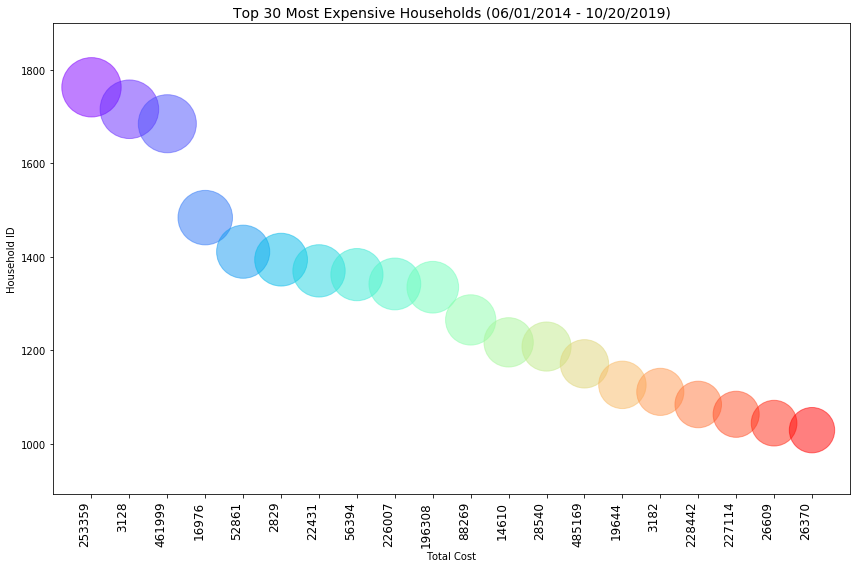

In [82]:
# Graph Time series per household
df_ts = pd.DataFrame(df_transaction, columns=['membership_id','call_status_recv_date',var_to_predict[0], 'member_status'])
min_date = df_ts['call_status_recv_date'].min().strftime("%m/%d/%Y") 
max_date = df_ts['call_status_recv_date'].max().strftime("%m/%d/%Y") 
df_ts = df_ts[(df_ts.member_status != 'CANCELLED')]
t_membership_id = pd.DataFrame(df_ts.groupby(by=["membership_id"],
    axis=0,
    as_index=False,
    sort=True,
    group_keys=True,
    squeeze=True,
    observed=False).sum(), columns=['membership_id',var_to_predict[0]])

t_membership_id['pct'] = round(t_membership_id[var_to_predict]/t_membership_id[var_to_predict].sum()*100,2)
top_members = t_membership_id.sort_values(by=var_to_predict, ascending=False).head(20)
top_members['membership_id'] = top_members['membership_id'].astype(str)
top_members[var_to_predict] = top_members[var_to_predict].astype(int)
colors = cm.rainbow(np.linspace(0, 1, top_members.shape[0]))
plt.scatter(x=top_members.membership_id, y=top_members[var_to_predict], 
            s=top_members[var_to_predict]*2, alpha=0.5, c=colors)
plt.xlabel("Total Cost")
plt.ylabel("Household ID")
plt.title("Top 30 Most Expensive Households ("+ min_date + " - " + max_date + ")", loc="center")
plt.xticks(rotation=90, 
           horizontalalignment='right',
           fontweight='light',
           fontsize='large')
bottom, top = plt.ylim()
plt.ylim(bottom - 100, top + 100)
plt.savefig('./model_pics/total_cost/'+var_to_predict_save+'_top30')
plt.show()

In [86]:
fig = px.scatter(top_members, x='membership_id', y=var_to_predict[0], size=var_to_predict[0], 
                 color=top_members['membership_id'],size_max=60,text=var_to_predict[0],
                 labels = {'membership_id':'Membership ID', 'total_cost':'Total Costs'},
                 title = "Top 30 Most Expensive Households ("+ min_date + " - " + max_date + ")",
                )
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_top30_1.png')
fig.show()

In [88]:
# Line chart
df_ts = pd.DataFrame(df_transaction, columns=['membership_id','call_status_recv_date',var_to_predict[0], 'member_status'])
min_date = df_ts['call_status_recv_date'].min().strftime("%m/%d/%Y") 
max_date = df_ts['call_status_recv_date'].max().strftime("%m/%d/%Y") 
df_ts = df_ts[(df_ts.member_status != 'CANCELLED')]
df_ts.set_index('call_status_recv_date', inplace=True)
df_ts_1 = df_ts.resample('W').sum()
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_ts_1.index, y=df_ts_1[var_to_predict[0]],
                        text=df_ts_1[var_to_predict], 
                        mode='lines+markers',
                        name='Total Costs'))
fig.update_layout(autosize=False, title_text='Time Series Analysis by Week - Total Costs',
                      xaxis_rangeslider_visible=True, height=700, width=900)
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_time_series.png')
fig.show()

In [90]:
# Line chart
df_ts = pd.DataFrame(df_transaction, columns=['membership_id','call_status_recv_date',var_to_predict[0], 'member_status'])
min_date = df_ts['call_status_recv_date'].min().strftime("%m/%d/%Y") 
max_date = df_ts['call_status_recv_date'].max().strftime("%m/%d/%Y") 
df_ts = df_ts[(df_ts.member_status != 'CANCELLED')]
df_ts.set_index('call_status_recv_date', inplace=True)
df_ts_1 = df_ts.resample('M').sum()
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_ts_1.index, y=df_ts_1[var_to_predict[0]],
                        text=df_ts_1[var_to_predict], 
                        mode='lines+markers',
                        name='Total Costs'))
fig.update_layout(autosize=False, title_text='Time Series Analysis by Month - Total Costs',
                      xaxis_rangeslider_visible=True, height=700, width=900)
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_time_series_mthly.png')
fig.show()

In [91]:
# Line chart
df_ts = pd.DataFrame(df_transaction, columns=['membership_id','call_status_recv_date',var_to_predict[0], 'member_status'])
min_date = df_ts['call_status_recv_date'].min().strftime("%m/%d/%Y") 
max_date = df_ts['call_status_recv_date'].max().strftime("%m/%d/%Y") 
df_ts = df_ts[(df_ts.member_status != 'CANCELLED')]
df_ts.set_index('call_status_recv_date', inplace=True)
df_ts_1 = df_ts.resample('Y').sum()
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_ts_1.index, y=df_ts_1[var_to_predict[0]],
                        text=df_ts_1[var_to_predict], 
                        mode='lines+markers',
                        name='Total Costs'))
fig.update_layout(autosize=False, title_text='Time Series Analysis by Month - Total Costs',
                      xaxis_rangeslider_visible=True, height=700, width=900)
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_time_series_yrly.png')
fig.show()

# Reload data to conduct another experiment

In [92]:
df_household.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2937 entries, 0 to 5260
Data columns (total 89 columns):
membership_id                        int64
household_key                        int64
income                               object
member_status                        object
state_grouped                        object
credit_ranges                        object
cancel_reason                        object
renew_method                         object
plus_indicator_description           object
zip                                  int64
sc_vehicle_manufacturer_name         object
sc_vehicle_model_name                object
race                                 object
home_owner                           object
education                            object
dwelling_type                        object
gender                               object
occupation_code                      object
occupation_group                     object
occupant_type                        object
mosaic_household

# Original Numeric Columns
col_num =['aaa_member_tenure_years','aaa_mean_age','length_of_residence','aaa_mortgage','aaa_credit_card','aaa_deposit',
          'aaa_home_equity', 'aaa_financial_service','aaa_auto_insurance','aaa_id_theft','aaa_motorcycle_indicator',
          'aaa_travel','aaa_mean_child','aaa_no_race','aaa_no_home_owner','aaa_no_education','aaa_no_income',
          'aaa_no_dwelling_type','aaa_no_credit_ranges','aaa_no_gender','aaa_no_language','aaa_no_reason_joined',
          'aaa_no_mosaic_household','aaa_no_mosaic_global_household', 'aaa_no_kcl_b_ind_mosaicsgrouping',
          'aaa_no_occupation_code','aaa_no_occupation_group','aaa_no_occupant_type','aaa_no_plus_indicator_description',
          'aaa_no_generation','total_member_cost_1','total_member_cost_2','total_member_cost_3','basic_cost','plus_cost',
          'premier_cost','total_calls','total_member_cost','mean_total_member_cost','total_tow_miles','mean_tow_miles',
          'total_members_in_household','total_calls_veh','total_cost_veh','total_member_cost_veh','mean_total_calls_veh',
          'mean_total_cost_veh','mean_total_member_cost_veh','consumer_score','use_road_side'
         ]

# Type of correlation
http://blogeducativope-t5.blogspot.com/2018/05/514-linear-correlation-coefficient.html Our threshold will be set up to 0.75 to -0.75 meaning it will only use upt to moderate correlation

# Correlation Analysis
librimind.com: 'Data columns with very similar trends are also likely to carry very similar information. In this case, only one of them will suffice to feed the machine learning model. Here we calculate the correlation coefficient between numerical and nominal columns as the Coefficient and the Pearson’s chi square value respectively. Pairs of columns with correlation coefficient higher than a threshold are reduced to only one.

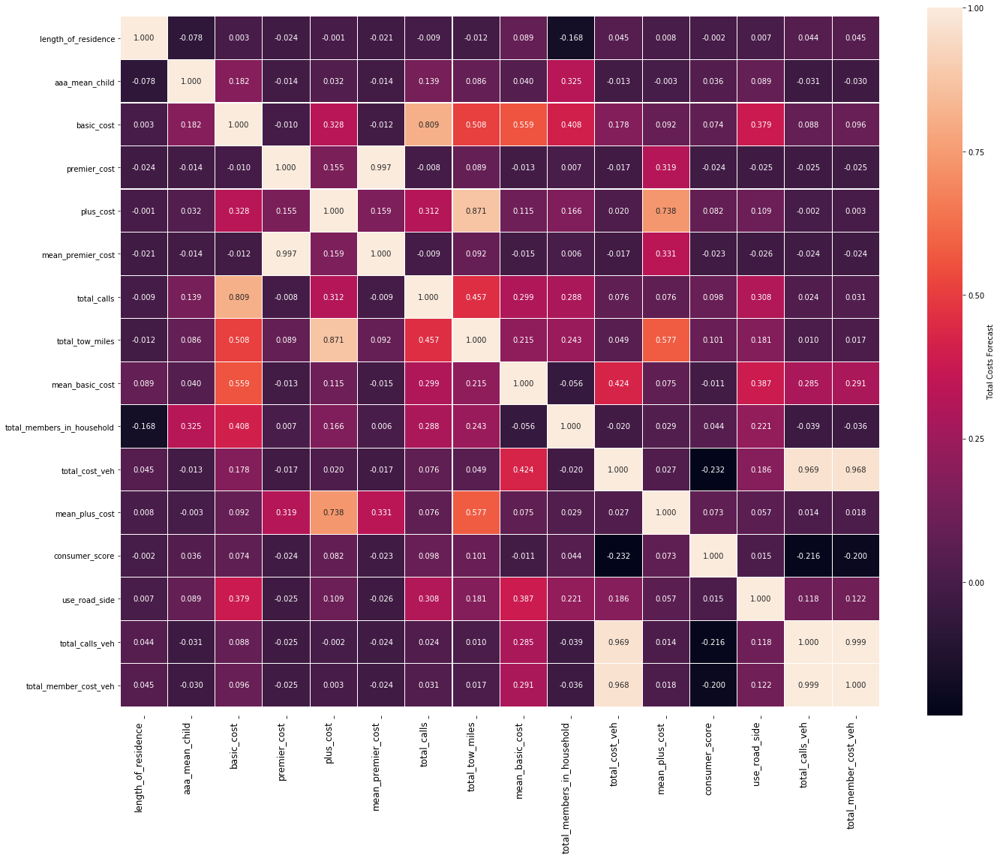

In [94]:
# Select all numeric features from df_household
# Get only numeric columns
# col_num = df_household.select_dtypes(include=np.number).columns.tolist()
# Removed: basic_costs, plus_cost, total_member_cost, total_cost_veh - All highly correlated so decided to remove them
col_num =['length_of_residence','aaa_mean_child', 'basic_cost', 'premier_cost', 'plus_cost',
          'mean_premier_cost','total_calls','total_tow_miles','mean_basic_cost', 
          'total_members_in_household', 'total_cost_veh','mean_plus_cost',
          'consumer_score','use_road_side', 'total_calls_veh','total_member_cost_veh'
         ]
df_corr = pd.DataFrame(df_household, columns=col_num)
df_corr = df_corr.corr()
plt.figure(figsize=(20,16))
sns.heatmap(df_corr, annot=True, fmt=".3f", linewidths=0.1, xticklabels=True, 
                cbar_kws={'label': var_to_predict_title}, yticklabels=True)
bottom, top = plt.ylim()
plt.ylim(bottom + 0.7, top - 0.7)
plt.xticks(rotation=90, 
           horizontalalignment='right',
           fontweight='light',
           fontsize='large')
plt.savefig('./model_pics/total_cost/'+var_to_predict_save+'_var_corr')
plt.show()

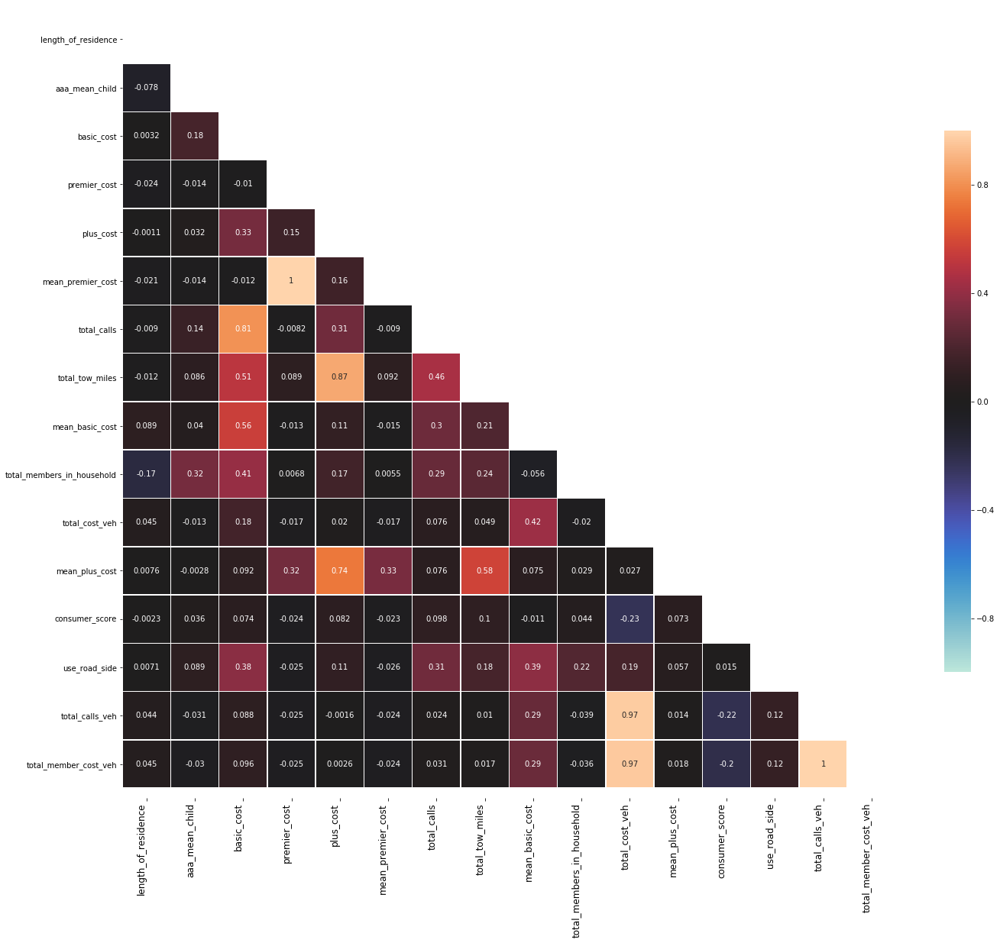

In [95]:
# Correlation
df_corr = pd.DataFrame(df_household, columns=col_num)
df_corr = df_corr.corr()

mask = np.zeros_like(df_corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(20, 20))

#cmap = sns.diverging_palette(180, 20, as_cmap=True)
sns.heatmap(df_corr, mask=mask, vmax=1, vmin =-1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
bottom, top = plt.ylim()
plt.ylim(bottom + 0.7, top - 0.7)
plt.xticks(rotation=90, 
           horizontalalignment='right',
           fontweight='light',
           fontsize='large')
plt.savefig('./model_pics/total_cost/'+var_to_predict_save+'_var_corr_1')
plt.show()

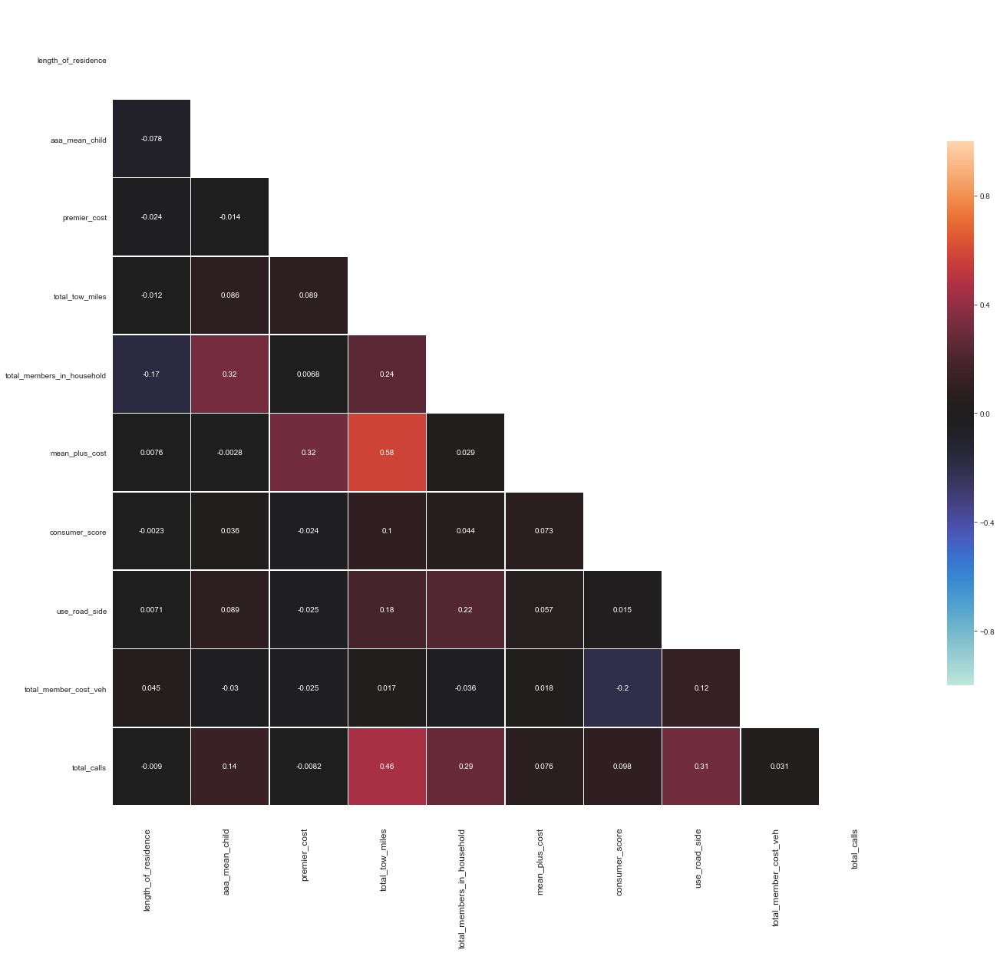

In [153]:
# Remove columns with strong correlation
# Columns to remove = ['basic_cost','mean_premier_cost', 'total_calls', 'plus_cost', 'total_calls_veh', 'total_cost_veh']

col_num =['length_of_residence','aaa_mean_child', 'premier_cost', 
          'total_tow_miles', 'total_members_in_household', 'mean_plus_cost',
          'consumer_score','use_road_side', 'total_member_cost_veh', 'total_calls'
         ]

# Correlation
df_corr = pd.DataFrame(df_household, columns=col_num)
df_corr = df_corr.corr()

mask = np.zeros_like(df_corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(20, 20))

#cmap = sns.diverging_palette(180, 20, as_cmap=True)
sns.heatmap(df_corr, mask=mask, vmax=1, vmin =-1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
bottom, top = plt.ylim()
plt.ylim(bottom + 0.7, top - 0.7)
plt.xticks(rotation=90, 
           horizontalalignment='right',
           fontweight='light',
           fontsize='large')
plt.savefig('./model_pics/total_cost/'+var_to_predict_save+'_var_corr_2')
plt.show()

In [122]:
df_household.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2937 entries, 0 to 5260
Data columns (total 89 columns):
membership_id                        int64
household_key                        int64
income                               object
member_status                        object
state_grouped                        object
credit_ranges                        object
cancel_reason                        object
renew_method                         object
plus_indicator_description           object
zip                                  int64
sc_vehicle_manufacturer_name         object
sc_vehicle_model_name                object
race                                 object
home_owner                           object
education                            object
dwelling_type                        object
gender                               object
occupation_code                      object
occupation_group                     object
occupant_type                        object
mosaic_household

In [154]:
# Reload data to conduct another experiment
df_household = reiniciar(df_household)
cols_house_dummmies = ['plus_indicator_description', 'generation',
                       'occupation_group','sc_vehicle_manufacturer_name', 'tenure', 'aaa_auto_insurance',
                       'no_members', 'kcl_b_ind_mosaicsgrouping','education', 
                       'aaa_motorcycle_indicator', 'income'
                      ]
# Get features from previous heatmap
feature_cols = col_num.copy()

# Build Dummies Variables
df_dummies = pd.get_dummies(df_household, columns=cols_house_dummmies)
for i in cols_house_dummmies:
    cols = [j for j in df_dummies.columns if j.startswith(i)]
    feature_cols += cols

# construct Dataframe for prediction
feature_cols += var_to_predict
df_prediction = pd.DataFrame(df_dummies, columns=feature_cols, index=df_household.index)

# Stripping out spaces from ends of names, and replacing internal spaces with "_"
df_prediction.columns = [col.strip().replace(' ', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('&', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('+', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace(',', '').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('(', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace(')', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('<', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('.', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('/', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('-', '_').lower() for col in df_prediction.columns]

# Fix Nans
# Number of child
df_prediction.aaa_mean_child.fillna(value=0, inplace=True)

# Drop Unknown Columns 
cols_to_drop = [j for j in df_prediction.columns if j.endswith('unknown')]
df_prediction.drop(labels=cols_to_drop,axis=1, inplace=True)

# Save columns name for future use in modelling to split X-Input and y-Output
X_cols = df_prediction.columns[:-1]
y_cols = var_to_predict.copy()

df_prediction.head(5)

,length_of_residence,aaa_mean_child,premier_cost,total_tow_miles,total_members_in_household,mean_plus_cost,consumer_score,use_road_side,total_member_cost_veh,total_calls,plus_indicator_description_basic_membership,plus_indicator_description_plus_membership,plus_indicator_description_plus_membership_with_motorcycle_coverage,plus_indicator_description_premier_membership,generation_baby_boomers__1948___1968_,generation_generation_x__1969___1980_,generation_generation_z__1994___2010_,generation_millenials__1981___1993_,generation_post_war____1948_,occupation_group_management,occupation_group_other,occupation_group_professional,occupation_group_retired,sc_vehicle_manufacturer_name_luxury_vehicle,sc_vehicle_manufacturer_name_middle_end_vehicle,sc_vehicle_manufacturer_name_standard_end_vehicle,tenure__40_years,tenure_between_21___40_years,tenure_under_20_years,aaa_auto_insurance_0,aaa_auto_insurance_1,no_members__5___member,no_members_1___member,no_members_2___member,no_members_3___member,no_members_4___member,kcl_b_ind_mosaicsgrouping_boomers,kcl_b_ind_mosaicsgrouping_golden_year,kcl_b_ind_mosaicsgrouping_middle_class_melting_pot,kcl_b_ind_mosaicsgrouping_power_elite,kcl_b_ind_mosaicsgrouping_singles_and_starters,education_completed_college,education_high_school,education_some_college,aaa_motorcycle_indicator_0_0,aaa_motorcycle_indicator_1_0,income_100k_,income_40___99999,income_under_39999,total_cost
0,15.0000,2.0000,0.0000,0.8000,1,0.0000,0.0137,1,303128.5500,18.0000,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,1,304.5000
2,8.5556,1.0000,0.0000,0.0000,4,0.0000,0.0123,1,56317.2900,9.0000,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,1,0,352.8500
3,15.0000,1.0000,0.0000,0.0000,1,0.0000,0.0143,0,18754.4000,0.0000,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,1,0,28.0000
4,15.0000,2.0000,0.0000,7.0000,3,0.0000,0.0156,1,68772.9200,1.0000,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,1,0,0,323.8500
5,13.0000,4.5000,0.0000,7.0000,3,0.0000,0.0132,1,49567.9900,1.0000,1,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,159.0000


In [155]:
df_prediction.describe()

,length_of_residence,aaa_mean_child,premier_cost,total_tow_miles,total_members_in_household,mean_plus_cost,consumer_score,use_road_side,total_member_cost_veh,total_calls,plus_indicator_description_basic_membership,plus_indicator_description_plus_membership,plus_indicator_description_plus_membership_with_motorcycle_coverage,plus_indicator_description_premier_membership,generation_baby_boomers__1948___1968_,generation_generation_x__1969___1980_,generation_generation_z__1994___2010_,generation_millenials__1981___1993_,generation_post_war____1948_,occupation_group_management,occupation_group_other,occupation_group_professional,occupation_group_retired,sc_vehicle_manufacturer_name_luxury_vehicle,sc_vehicle_manufacturer_name_middle_end_vehicle,sc_vehicle_manufacturer_name_standard_end_vehicle,tenure__40_years,tenure_between_21___40_years,tenure_under_20_years,aaa_auto_insurance_0,aaa_auto_insurance_1,no_members__5___member,no_members_1___member,no_members_2___member,no_members_3___member,no_members_4___member,kcl_b_ind_mosaicsgrouping_boomers,kcl_b_ind_mosaicsgrouping_golden_year,kcl_b_ind_mosaicsgrouping_middle_class_melting_pot,kcl_b_ind_mosaicsgrouping_power_elite,kcl_b_ind_mosaicsgrouping_singles_and_starters,education_completed_college,education_high_school,education_some_college,aaa_motorcycle_indicator_0_0,aaa_motorcycle_indicator_1_0,income_100k_,income_40___99999,income_under_39999,total_cost
count,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000,2937.0000
mean,8.0691,1.4659,0.0327,8.4926,2.4654,1.9113,0.0149,0.6956,121571.8598,9.7395,0.3953,0.2836,0.0007,0.0238,0.2741,0.0480,0.0037,0.0381,0.6187,0.1052,0.0327,0.1801,0.2530,0.0957,0.0429,0.5638,0.6173,0.1638,0.2189,0.6919,0.3081,0.0769,0.2462,0.3544,0.2002,0.1222,0.2469,0.3160,0.0599,0.0855,0.0514,0.1277,0.1941,0.2094,0.3030,0.4848,0.2775,0.3633,0.1158,164.2954
std,5.6942,1.0682,1.5078,22.0101,1.3017,8.6630,0.0013,0.4602,94976.9744,20.9416,0.4890,0.4508,0.0261,0.1526,0.4461,0.2138,0.0611,0.1916,0.4858,0.3069,0.1778,0.3843,0.4348,0.2942,0.2027,0.4960,0.4861,0.3701,0.4136,0.4618,0.4618,0.2666,0.4309,0.4784,0.4002,0.3276,0.4313,0.4650,0.2374,0.2796,0.2209,0.3338,0.3956,0.4069,0.4596,0.4999,0.4478,0.4810,0.3200,205.5951
min,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0123,0.0000,112.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
25%,2.6667,1.0000,0.0000,0.0000,2.0000,0.0000,0.0143,0.0000,62130.2300,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,30.0000
50%,8.0000,1.0000,0.0000,0.0000,2.0000,0.0000,0.0149,1.0000,62130.2300,2.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,106.0000
75%,13.1250,2.0000,0.0000,7.0000,3.0000,0.0000,0.0154,1.0000,203391.9500,9.0000,1.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,1.0000,

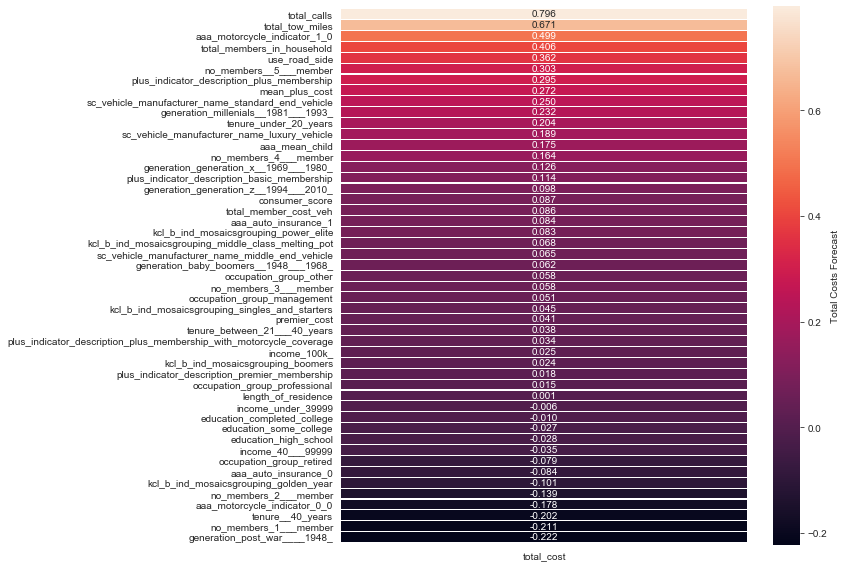

In [156]:
#  Correlation of AAA Costs and other numeric features
# Heat Map 
df_corr = df_prediction.corr()
df_corr.sort_values(by=var_to_predict[0], ascending=False, inplace=True)
df_corr = df_corr[df_corr.index.values!=var_to_predict[0]]
sns.heatmap(df_corr[[var_to_predict[0]]], annot=True, fmt=".3f", linewidths=0.1, xticklabels=True, 
                cbar_kws={'label': var_to_predict_title}, yticklabels=True)
bottom, top = plt.ylim()
plt.ylim(bottom + 0.7, top - 0.7)
plt.savefig('./model_pics/total_cost/'+var_to_predict_save+'_var_corr_tot_cost')
plt.show()
#df_corr

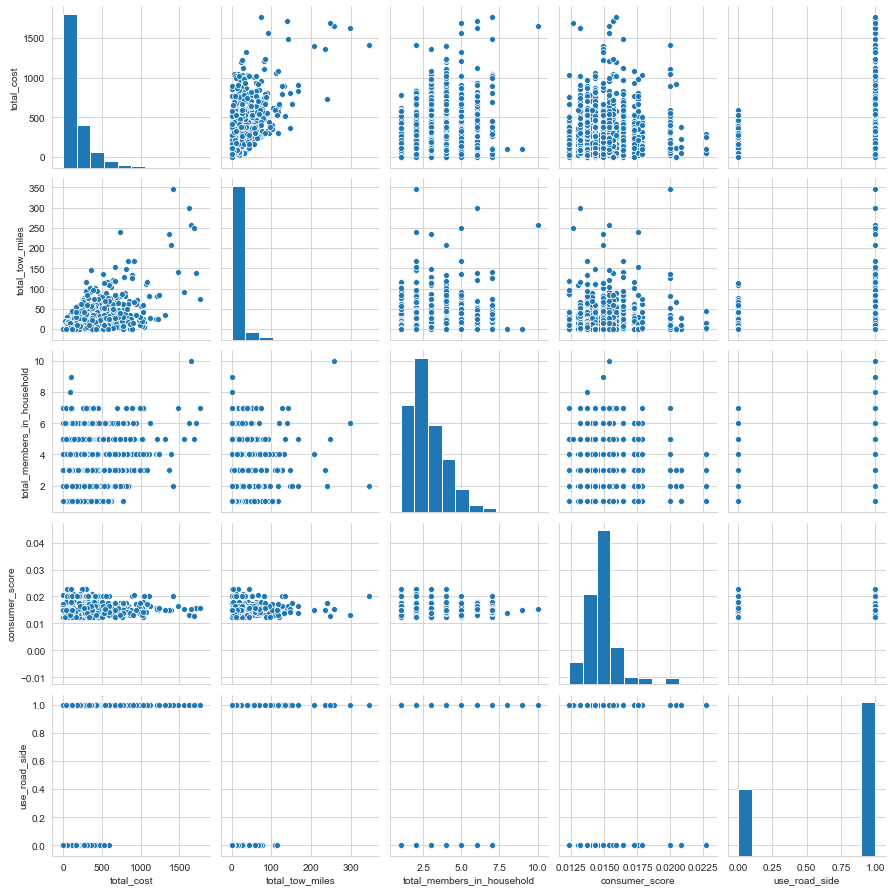

In [157]:
# Pair plot 
sns.pairplot(df_prediction[[var_to_predict[0], 'total_tow_miles', 'total_members_in_household', 
                            'consumer_score','use_road_side']])
plt.show()

In [158]:
# Reset figure and display settings
%matplotlib inline
pd.plotting.register_matplotlib_converters()
pd.options.display.float_format = '{:.4f}'.format
rcParams.update({'figure.autolayout': True, 'figure.figsize':(12,8),'axes.titlesize':14})

# Setting Up the Training and Test data for up Sampling the minority class
To use the same split in all models

# Algorithms Search and Testing

In [ ]:
from sklearn.utils.testing import all_estimators
from sklearn import base
from sklearn.metrics import SCORERS


estimators = all_estimators()
for name, class_ in estimators:
    if issubclass(class_, base.RegressorMixin):
        print(name)

SCORERS.keys()

In [159]:
num_folds = 10
np.random.seed(42)
scoring = 'neg_mean_squared_error'
test_size = 0.30

# Create input and output dataframes

X_df = pd.DataFrame(df_prediction,columns=X_cols, index=df_prediction.index)
y_df = pd.DataFrame(df_prediction,columns=y_cols, index=df_prediction.index)

# Transform / Normalize the data
scaler_x = PowerTransformer()
scaled_df_x = scaler_x.fit_transform(X_df)
scaled_df_x = pd.DataFrame(scaled_df_x, columns=X_df.columns, index=X_df.index)

scaler_y = PowerTransformer()
scaled_df_y = scaler_y.fit_transform(y_df)
scaled_df_y = pd.DataFrame(scaled_df_y, columns=y_df.columns, index=y_df.index)


# Split Train and test
trainX, testX, trainy, testy = train_test_split(scaled_df_x, scaled_df_y, test_size=test_size)

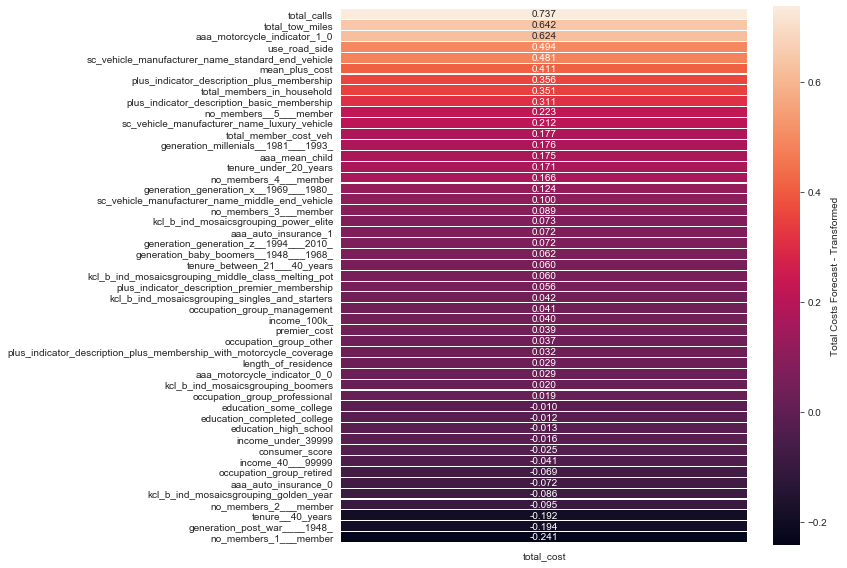

In [160]:
#  Correlation of AAA Costs and other numeric features
# Heat Map 
df_corr = scaled_df_x.copy()
df_corr[var_to_predict] = scaled_df_y[var_to_predict]
df_corr = df_corr.corr()
df_corr.sort_values(by=var_to_predict[0], ascending=False, inplace=True)
df_corr = df_corr[df_corr.index.values!=var_to_predict[0]]
sns.heatmap(df_corr[[var_to_predict[0]]], annot=True, fmt=".3f", linewidths=0.1, xticklabels=True, 
                cbar_kws={'label': var_to_predict_title+' - Transformed'}, yticklabels=True)
bottom, top = plt.ylim()
plt.ylim(bottom + 0.7, top - 0.7)
plt.savefig('./model_pics/total_cost/'+var_to_predict_save+'_var_corr_tot_cost_transf')
plt.show()
#df_corr

# Algorithms Search and testing

In [161]:
# Verify is there is no nulls
df_prediction[df_prediction.isnull().any(axis=1)]

,length_of_residence,aaa_mean_child,premier_cost,total_tow_miles,total_members_in_household,mean_plus_cost,consumer_score,use_road_side,total_member_cost_veh,total_calls,plus_indicator_description_basic_membership,plus_indicator_description_plus_membership,plus_indicator_description_plus_membership_with_motorcycle_coverage,plus_indicator_description_premier_membership,generation_baby_boomers__1948___1968_,generation_generation_x__1969___1980_,generation_generation_z__1994___2010_,generation_millenials__1981___1993_,generation_post_war____1948_,occupation_group_management,occupation_group_other,occupation_group_professional,occupation_group_retired,sc_vehicle_manufacturer_name_luxury_vehicle,sc_vehicle_manufacturer_name_middle_end_vehicle,sc_vehicle_manufacturer_name_standard_end_vehicle,tenure__40_years,tenure_between_21___40_years,tenure_under_20_years,aaa_auto_insurance_0,aaa_auto_insurance_1,no_members__5___member,no_members_1___member,no_members_2___member,no_members_3___member,no_members_4___member,kcl_b_ind_mosaicsgrouping_boomers,kcl_b_ind_mosaicsgrouping_golden_year,kcl_b_ind_mosaicsgrouping_middle_class_melting_pot,kcl_b_ind_mosaicsgrouping_power_elite,kcl_b_ind_mosaicsgrouping_singles_and_starters,education_completed_college,education_high_school,education_some_college,aaa_motorcycle_indicator_0_0,aaa_motorcycle_indicator_1_0,income_100k_,income_40___99999,income_under_39999,total_cost


Total Costs Forecast - Algorithm Comparison - Regression
BR: RMSE : -0.115 - Std. Dev.: (0.021)
DTR: RMSE : -0.223 - Std. Dev.: (0.032)
EN: RMSE : -0.748 - Std. Dev.: (0.087)
ENCV: RMSE : -0.115 - Std. Dev.: (0.022)
LASSO: RMSE : -1.022 - Std. Dev.: (0.100)
LASCV: RMSE : -0.115 - Std. Dev.: (0.022)
LSVR: RMSE : -0.117 - Std. Dev.: (0.022)
SGDR: RMSE : -0.116 - Std. Dev.: (0.022)
KNNR: RMSE : -0.316 - Std. Dev.: (0.059)
RIDGE: RMSE : -0.115 - Std. Dev.: (0.021)
RIDCV: RMSE : -0.115 - Std. Dev.: (0.021)
ABR: RMSE : -0.247 - Std. Dev.: (0.027)
GBR: RMSE : -0.103 - Std. Dev.: (0.018)
RFR: RMSE : -0.126 - Std. Dev.: (0.019)
ET: RMSE : -0.131 - Std. Dev.: (0.019)
XGB: RMSE : -0.103 - Std. Dev.: (0.018)
BGR: RMSE : -0.128 - Std. Dev.: (0.017)


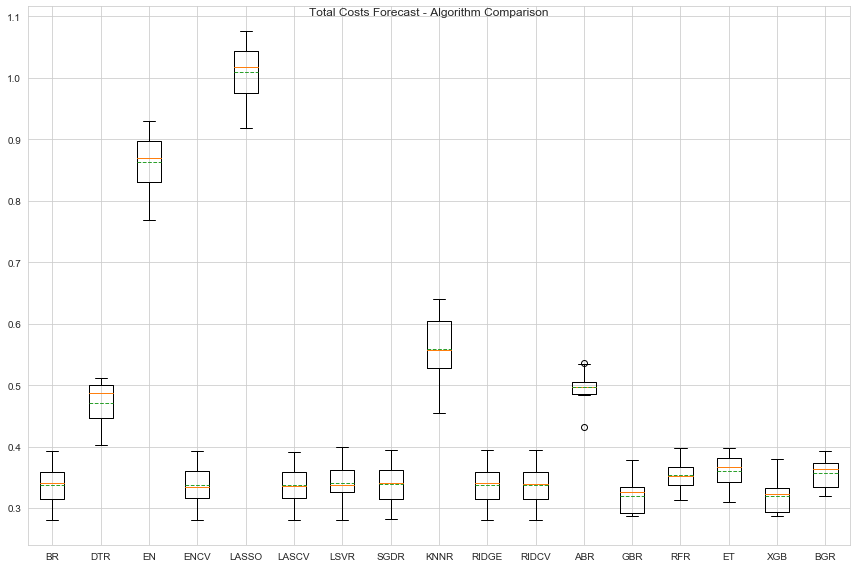

In [162]:
# Algorithms Search
# Spot Check Algorithms

# Linear Regression Methods
print(var_to_predict_title+' - Algorithm Comparison - Regression')
models = []
#models.append(('OLS', LinearRegression(normalize=False)))
models.append(('BR', BayesianRidge(normalize=False)))
models.append(('DTR', DecisionTreeRegressor()))
models.append(('EN', ElasticNet(normalize=False)))
models.append(('ENCV', ElasticNetCV(normalize=False)))
models.append(('LASSO', Lasso(normalize=False)))
models.append(('LASCV', LassoCV(normalize=False)))
models.append(('LSVR', LinearSVR()))
models.append(('SGDR', SGDRegressor()))
models.append(('KNNR', KNeighborsRegressor()))
models.append(('RIDGE', Ridge(normalize=False)))
models.append(('RIDCV', RidgeCV(normalize=False)))

results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=num_folds)
    cv_results = cross_val_score(model, trainX, trainy, cv=kfold, scoring=scoring)
    # Calculate RMSE
    results.append(np.sqrt(np.abs(cv_results)))
    names.append(name)                          
    msg = "%s: RMSE : %.3f - Std. Dev.: (%.3f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

# Ensembles Methods
ensembles = []
ensembles.append(('ABR', AdaBoostRegressor()))
ensembles.append(('GBR', GradientBoostingRegressor()))
ensembles.append(('RFR', RandomForestRegressor(n_estimators=10)))
ensembles.append(('ET', ExtraTreesRegressor(n_estimators=10)))
ensembles.append(('XGB', XGBRegressor(silent=True)))
ensembles.append(('BGR', BaggingRegressor()))

for name, model in ensembles:
    kfold = KFold(n_splits=num_folds)
    cv_results = cross_val_score(model, trainX, trainy, cv=kfold, scoring=scoring)
    results.append(np.sqrt(np.abs(cv_results)))
    names.append(name)
    msg = "%s: RMSE : %.3f - Std. Dev.: (%.3f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

# Compare Algorithms
fig = plt.figure()
fig.suptitle(var_to_predict_title+' - Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results, meanline=True, showmeans=True)
ax.set_xticklabels(names)
plt.savefig('./model_pics/total_cost/'+var_to_predict_save+'_algorithms')
plt.show()

# Observation

R^2 (coefficient of determination) regression score function.

    * Best possible score is 1.0 and it can be negative (because the model can be arbitrarily worse). A constant model that
    always predicts the expected value of y, disregarding the input features, would get a R^2 score of 0.0.

mean_squared_error
    * A non-negative floating point value (the best value is 0.0)
    The MSE is a measure of the quality of an estimator—it is always non-negative, and values closer to zero are better.

Based on the graph above (RMSE):
    * 1) XGB: RMSE : -0.103 - Std. Dev.: (0.018)
    * 2) GBR: RMSE : -0.103 - Std. Dev.: (0.018)
    * 3) RIDCV: RMSE : -0.115 - Std. Dev.: (0.021)
    * 4) RFR: RMSE : -0.126 - Std. Dev.: (0.019)
    * 5) ET: RMSE : -0.131 - Std. Dev.: (0.019)

# Grid Search XGB Regressor

In [ ]:
# Grid Search XGBOOST regression
np.random.seed(42)
xgbr_param_grid = {'n_estimators': [100, 250, 500, 1000],
                  'max_depth': [3,4,5,6], 'learning_rate': [0.1, 0.01, 0.05]
                 }
kfold = KFold(n_splits=num_folds)
xgbr = XGBRegressor(silent=True)
# Perform grid search: grid_mse
xgbr_grid = GridSearchCV(estimator=xgbr, param_grid=xgbr_param_grid,
                       scoring=scoring, cv=kfold, verbose=1, n_jobs=10)
xgbr_grid.fit(trainX, trainy)
# Print the best parameters and lowest RMSE
print("Best parameters found: ", xgbr_grid.best_params_)
print("Lowest RMSE found: ", np.sqrt(np.abs(xgbr_grid.best_score_)))
            

# Observation
These are the best parameters:

First run identifying C
    * Best parameters found:  {'booster': 'gbtree', 'colsample_bytree': 0.7, 'gamma': 0, 'learning_rate': 0.01, 'max_depth': 4, 'n_estimators': 500}
Lowest RMSE found:  0.3960648683735996

In [164]:
# Modeling based on the outcome of the grid serach of the random forest
xgbr = XGBRegressor(silent=True, learning_rate=0.01, max_depth=4, n_estimators=500, gamma=0)

xgbr.fit(trainX, trainy)

# Predict on test set
yhat_train = xgbr.predict(trainX)

# Predict on test set
yhat = xgbr.predict(testX)

# Calculate Cross valdation scores
scores_xgbr = cross_val_score(xgbr, testX, testy, cv=num_folds, scoring=scoring)

print('XGBoost Classifer Train r2 score - Transformed : %.5f' % r2_score(trainy, yhat_train))
print('XGBoost Classifer Test r2 score - Transformed  : %.5f' % r2_score(testy, yhat))
yhat_train_mse1 = mean_squared_error(trainy, yhat_train)
yhat_test_mse1 = mean_squared_error(testy, yhat)
yhat_train_rmse1 = np.sqrt(yhat_train_mse1)
yhat_test_rmse1 = np.sqrt(yhat_test_mse1)
print('XGBoost Classifer  Train MSE - Transformed    : %.5f' % yhat_train_mse1)
print('XGBoost Classifer  Test MSE - Transformed     : %.5f' % yhat_test_mse1)
print('XGBoost Classifer  Train RMSE - Transformed   : %.5f' % yhat_train_rmse1)
print('XGBoost Classifer  Test RMSE - Transformed    : %.5f' % yhat_test_rmse1)

# Plot Cross Validation RMSE Scores
fig = px.line(np.sqrt(np.abs(scores_xgbr)), y=np.sqrt(np.abs(scores_xgbr)), labels={'y':'RMSE'}, title=var_to_predict_title+ ' - RMSE Cross Validation Scores - Transformed')
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_xgbr_crossv.png')
fig.show()

XGBoost Classifer Train r2 score - Transformed : 0.92851
XGBoost Classifer Test r2 score - Transformed  : 0.88483
XGBoost Classifer  Train MSE - Transformed    : 0.07299
XGBoost Classifer  Test MSE - Transformed     : 0.10932
XGBoost Classifer  Train RMSE - Transformed   : 0.27017
XGBoost Classifer  Test RMSE - Transformed    : 0.33064


In [165]:
# Untransformed series
un_trainy = trainy.copy()
un_trainy[var_to_predict] = scaler_y.inverse_transform(un_trainy) 

un_testy = testy.copy()
un_testy[var_to_predict] = scaler_y.inverse_transform(un_testy) 

un_yhat_train = pd.DataFrame(data=scaler_y.inverse_transform(yhat_train.reshape(-1, 1)), 
                                  index=trainy.index, columns=var_to_predict) 

un_yhat = pd.DataFrame(data=scaler_y.inverse_transform(yhat.reshape(-1, 1)), 
                                  index=testy.index, columns=var_to_predict) 

# Build Training Dataframe
df_train = un_trainy.copy()
df_train['FCST Total Cost Train'] = un_yhat_train[var_to_predict]
df_train['FCST Error Train'] = un_yhat_train[var_to_predict]
df_train['FCST Error Train'] -= df_train['FCST Total Cost Train']

# Build test dataframe
df_test = un_testy.copy()
df_test['FCST Total Cost Test'] = un_yhat[var_to_predict]
df_test['FCST Error Test'] = df_test[var_to_predict]
df_test['FCST Error Test'] -= df_test['FCST Total Cost Test']

print('XGBoost Regressor Train r2 score : %.5f' % r2_score(un_trainy, un_yhat_train))
print('XGBoost Regressor Test  r2 score : %.5f' % r2_score(un_testy, un_yhat))
un_yhat_train_mse1 = mean_squared_error(un_trainy, un_yhat_train)
un_yhat_test_mse1 = mean_squared_error(un_testy, un_yhat)
un_yhat_train_rmse1 = np.sqrt(un_yhat_train_mse1)
un_yhat_test_rmse1 = np.sqrt(un_yhat_test_mse1)
print('XGBoost Regressor  Train MSE             : %.5f' % un_yhat_train_mse1)
print('XGBoost Regressor  Test MSE              : %.5f' % un_yhat_test_mse1)
print('XGBoost Regressor  Train RMSE            : %.5f' % un_yhat_train_rmse1)
print('XGBoost Regressor  Test RMSE             : %.5f' % un_yhat_test_rmse1)
print('XGBoost Regressor  Train Mean FCST Error : %.5f' % df_train['FCST Error Train'].mean())
print('XGBoost Regressor  Test Mean FCST Error  : %.5f' % df_test['FCST Error Test'].mean())


XGBoost Regressor Train r2 score : 0.89752
XGBoost Regressor Test  r2 score : 0.80940
XGBoost Regressor  Train MSE             : 4387.61323
XGBoost Regressor  Test MSE              : 7803.36067
XGBoost Regressor  Train RMSE            : 66.23906
XGBoost Regressor  Test RMSE             : 88.33663
XGBoost Regressor  Train Mean FCST Error : 0.00000
XGBoost Regressor  Test Mean FCST Error  : 9.39336


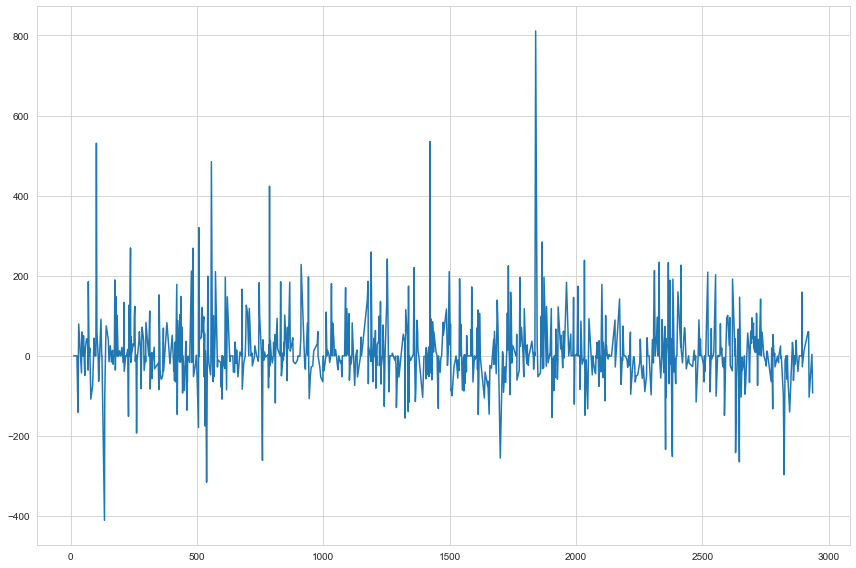

In [166]:
sns.lineplot(data=df_test['FCST Error Test'])
plt.show()

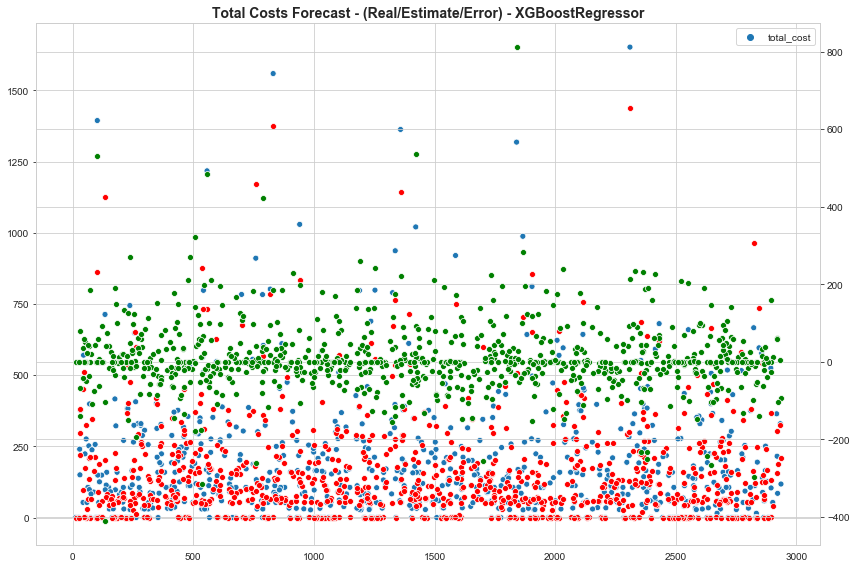

In [167]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
sns.scatterplot(data=df_test[var_to_predict], color="b", legend='full', ax=ax1)
sns.scatterplot(data=df_test['FCST Total Cost Test'], color="r", legend='full', ax=ax1)
sns.scatterplot(data=df_test['FCST Error Test'], color="g", legend='full', ax=ax2)
plt.title(var_to_predict_title+ ' - (Real/Estimate/Error) - XGBoostRegressor',fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost/'+var_to_predict_save+'_scatter_xgbr')
plt.show()

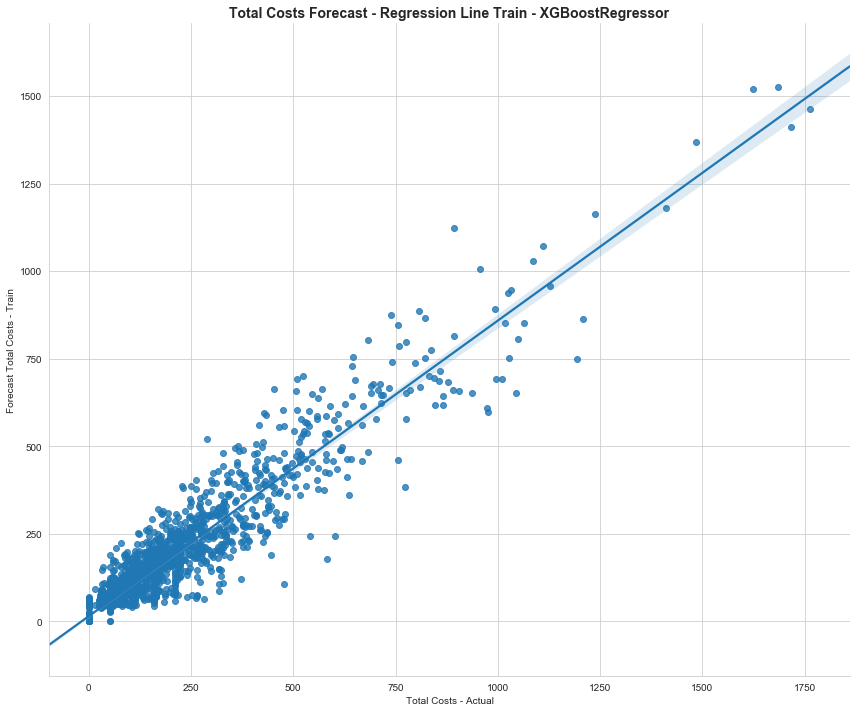

In [168]:
# Graph Train prediction
sns.set_style("whitegrid", {'axes.grid' : True})
g = sns.lmplot(x=var_to_predict[0], y='FCST Total Cost Train', data=df_train, height=10, aspect=1.2)
g.set_axis_labels("Total Costs - Actual", "Forecast Total Costs - Train") 
plt.title(var_to_predict_title+ ' - Regression Line Train - XGBoostRegressor',fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost/'+var_to_predict_save+'_fcst_train_xgbr')
plt.show()

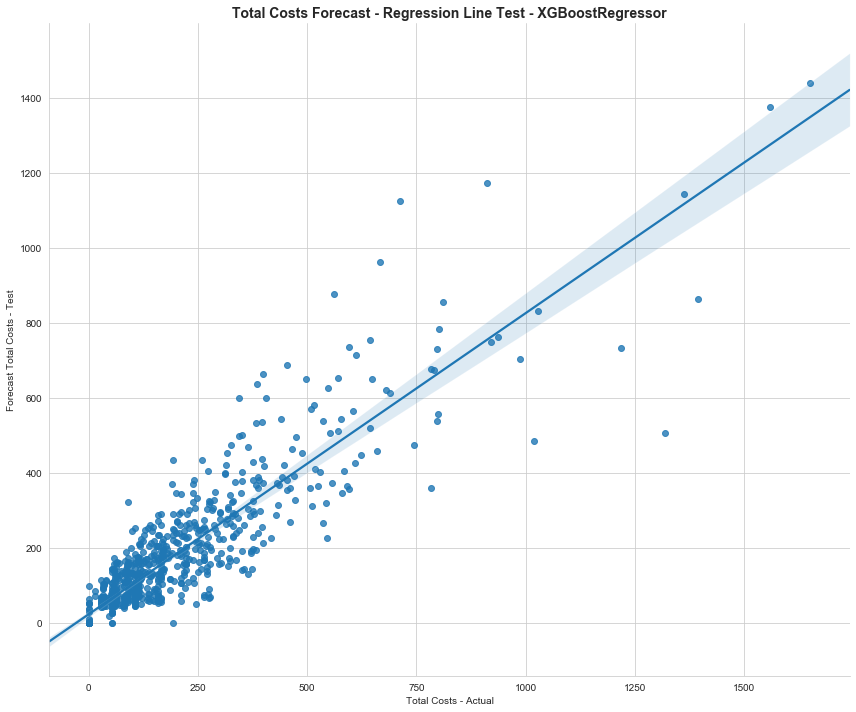

In [169]:
# Graph Test prediction
g = sns.lmplot(x=var_to_predict[0], y='FCST Total Cost Test', data=df_test, height=10, aspect=1.2)
g.set_axis_labels("Total Costs - Actual", "Forecast Total Costs - Test") 
plt.title(var_to_predict_title+ ' - Regression Line Test - XGBoostRegressor',fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost/'+var_to_predict_save+'_fcst_test_xgbr')
plt.show()

In [170]:
fig = px.line(un_yhat_train, y=var_to_predict[0], labels={var_to_predict[0]:var_to_predict_title}, title=var_to_predict_title+ ' - RMSE Cross Validation Scores - Transformed')
fig.show()

# Gradient Boosting Regression Grid Search

In [171]:
# Grid Search - Gradient Boosting Regression
np.random.seed(42)
gbr_param_grid = {'n_estimators': [100, 250, 500, 1000],
                  'max_depth': [3,4,5,6], 'learning_rate': [0.1, 0.01, 0.05],
                 }
kfold = KFold(n_splits=num_folds)
gbr = GradientBoostingRegressor()
# Perform grid search: grid_mse
gbr_grid = GridSearchCV(estimator=gbr, param_grid=gbr_param_grid,
                       scoring=scoring, cv=kfold, verbose=1, n_jobs=10)
gbr_grid.fit(trainX, trainy)
# Print the best parameters and lowest RMSE
print('Gradient boosting Regression - Grid Search')
print("Best parameters found: ", gbr_grid.best_params_)
print("Lowest RMSE found: ", np.sqrt(np.abs(gbr_grid.best_score_)))

Fitting 10 folds for each of 48 candidates, totalling 480 fits


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   45.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:  3.7min
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:  8.2min
[Parallel(n_jobs=10)]: Done 480 out of 480 | elapsed:  9.6min finished


Gradient boosting Regression - Grid Search
Best parameters found:  {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 1000}
Lowest RMSE found:  0.32040145464066017


# Observation
These are the best parameters:

First run identifying parameters
    * Gradient boosting Regression - Grid Search
    * Best parameters found:  {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 1000}
    * Lowest RMSE found:  0.32040145464066017


In [173]:
# Modeling based on the outcome of the grid serach of Gradient Boosting 
gbr = GradientBoostingRegressor(verbose=0, learning_rate=0.01, max_depth=3, n_estimators=1000)

gbr.fit(trainX, trainy)

# Predict on test set
yhat_train = gbr.predict(trainX)

# Predict on test set
yhat = gbr.predict(testX)

# Calculate Cross valdation scores
scores_gbr = cross_val_score(gbr, testX, testy, cv=num_folds, scoring=scoring)

print('Gradient Boost Regressor Train r2 score - Transformed : %.5f' % r2_score(trainy, yhat_train))
print('Gradient Boost Regressor Test r2 score - Transformed  : %.5f' % r2_score(testy, yhat))
yhat_train_mse1 = mean_squared_error(trainy, yhat_train)
yhat_test_mse1 = mean_squared_error(testy, yhat)
yhat_train_rmse1 = np.sqrt(yhat_train_mse1)
yhat_test_rmse1 = np.sqrt(yhat_test_mse1)
print('Gradient Boost Regressor  Train MSE - Transformed    : %.5f' % yhat_train_mse1)
print('Gradient Boost Regressor  Test MSE - Transformed     : %.5f' % yhat_test_mse1)
print('Gradient Boost Regressor Train RMSE - Transformed   : %.5f' % yhat_train_rmse1)
print('Gradient Boost Regressor Test RMSE - Transformed    : %.5f' % yhat_test_rmse1)

# Plot Cross Validation RMSE Scores
fig = px.line(np.sqrt(np.abs(scores_gbr)), y=np.sqrt(np.abs(scores_gbr)), labels={'y':'RMSE'}, title=var_to_predict_title+ ' - RMSE Cross Validation Scores - Transformed')
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_gbr_crossv.png')
fig.show()

Gradient Boost Regressor Train r2 score - Transformed : 0.92453
Gradient Boost Regressor Test r2 score - Transformed  : 0.88469
Gradient Boost Regressor  Train MSE - Transformed    : 0.07705
Gradient Boost Regressor  Test MSE - Transformed     : 0.10946
Gradient Boost Regressor Train RMSE - Transformed   : 0.27759
Gradient Boost Regressor Test RMSE - Transformed    : 0.33084


In [174]:
# Untransformed series
un_trainy = trainy.copy()
un_trainy[var_to_predict] = scaler_y.inverse_transform(un_trainy) 

un_testy = testy.copy()
un_testy[var_to_predict] = scaler_y.inverse_transform(un_testy) 

un_yhat_train = pd.DataFrame(data=scaler_y.inverse_transform(yhat_train.reshape(-1, 1)), 
                                  index=trainy.index, columns=var_to_predict) 

un_yhat = pd.DataFrame(data=scaler_y.inverse_transform(yhat.reshape(-1, 1)), 
                                  index=testy.index, columns=var_to_predict) 

# Build Training Dataframe
df_train = un_trainy.copy()
df_train['FCST Total Cost Train'] = un_yhat_train[var_to_predict]
df_train['FCST Error Train'] = un_yhat_train[var_to_predict]
df_train['FCST Error Train'] -= df_train['FCST Total Cost Train']

# Build test dataframe
df_test = un_testy.copy()
df_test['FCST Total Cost Test'] = un_yhat[var_to_predict]
df_test['FCST Error Test'] = df_test[var_to_predict]
df_test['FCST Error Test'] -= df_test['FCST Total Cost Test']

print('Gradient Boost Regressor Train r2 score : %.5f' % r2_score(un_trainy, un_yhat_train))
print('Gradient Boost Regressor Test  r2 score : %.5f' % r2_score(un_testy, un_yhat))
un_yhat_train_mse1 = mean_squared_error(un_trainy, un_yhat_train)
un_yhat_test_mse1 = mean_squared_error(un_testy, un_yhat)
un_yhat_train_rmse1 = np.sqrt(un_yhat_train_mse1)
un_yhat_test_rmse1 = np.sqrt(un_yhat_test_mse1)
print('Gradient Boost Regressor  Train MSE             : %.5f' % un_yhat_train_mse1)
print('Gradient Boost Regressor  Test MSE              : %.5f' % un_yhat_test_mse1)
print('Gradient Boost Regressor  Train RMSE            : %.5f' % un_yhat_train_rmse1)
print('Gradient Boost Regressor  Test RMSE             : %.5f' % un_yhat_test_rmse1)
print('Gradient Boost Regressor  Train Mean FCST Error : %.5f' % df_train['FCST Error Train'].mean())
print('Gradient Boost Regressor  Test Mean FCST Error  : %.5f' % df_test['FCST Error Test'].mean())


Gradient Boost Regressor Train r2 score : 0.89747
Gradient Boost Regressor Test  r2 score : 0.80287
Gradient Boost Regressor  Train MSE             : 4390.03125
Gradient Boost Regressor  Test MSE              : 8070.80242
Gradient Boost Regressor  Train RMSE            : 66.25731
Gradient Boost Regressor  Test RMSE             : 89.83764
Gradient Boost Regressor  Train Mean FCST Error : 0.00000
Gradient Boost Regressor  Test Mean FCST Error  : 9.62377


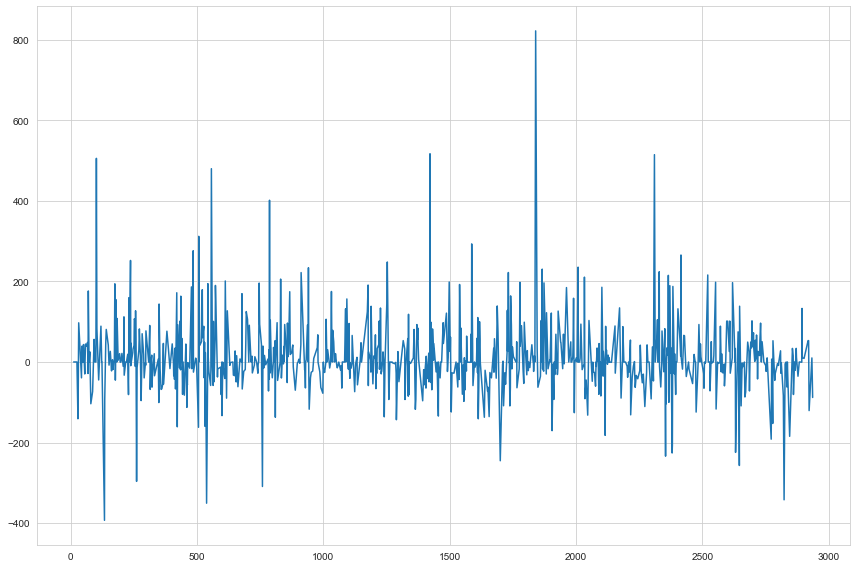

In [175]:
sns.lineplot(data=df_test['FCST Error Test'])
plt.show()

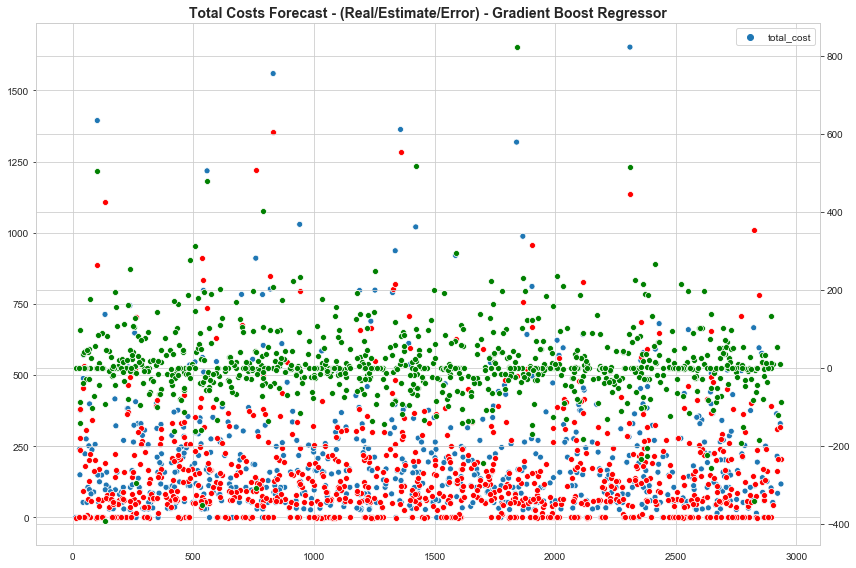

In [176]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
sns.scatterplot(data=df_test[var_to_predict], color="b", legend='full', ax=ax1)
sns.scatterplot(data=df_test['FCST Total Cost Test'], color="r", legend='full', ax=ax1)
sns.scatterplot(data=df_test['FCST Error Test'], color="g", legend='full', ax=ax2)
plt.title(var_to_predict_title+ ' - (Real/Estimate/Error) - Gradient Boost Regressor',
          fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost/'+var_to_predict_save+'_scatter_gbr')
plt.show()

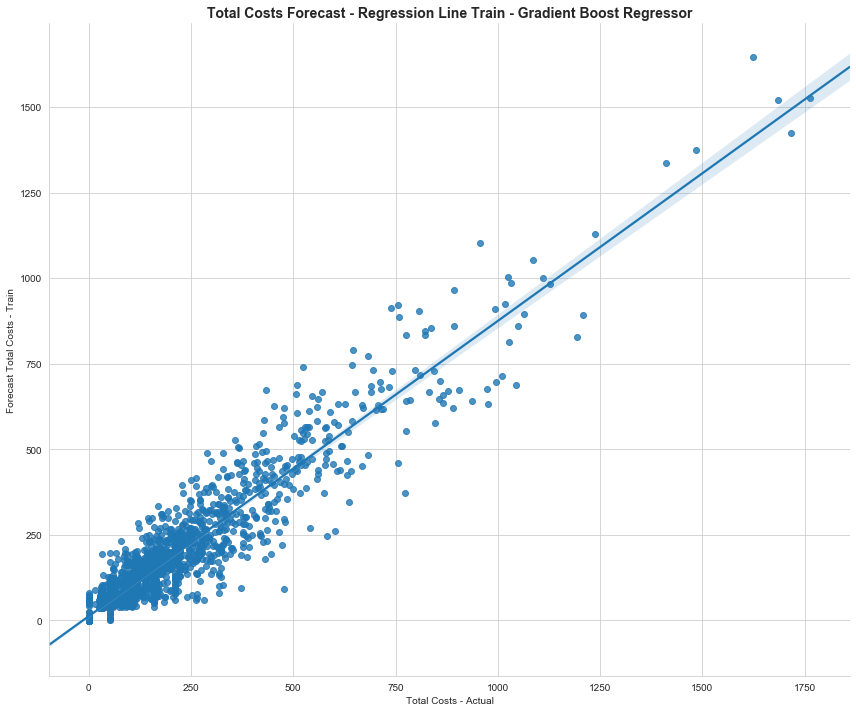

In [177]:
# Graph Train prediction
sns.set_style("whitegrid", {'axes.grid' : True})
g = sns.lmplot(x=var_to_predict[0], y='FCST Total Cost Train', data=df_train, height=10, aspect=1.2)
g.set_axis_labels("Total Costs - Actual", "Forecast Total Costs - Train") 
plt.title(var_to_predict_title+ ' - Regression Line Train - Gradient Boost Regressor',fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost/'+var_to_predict_save+'_fcst_train_gbr')
plt.show()

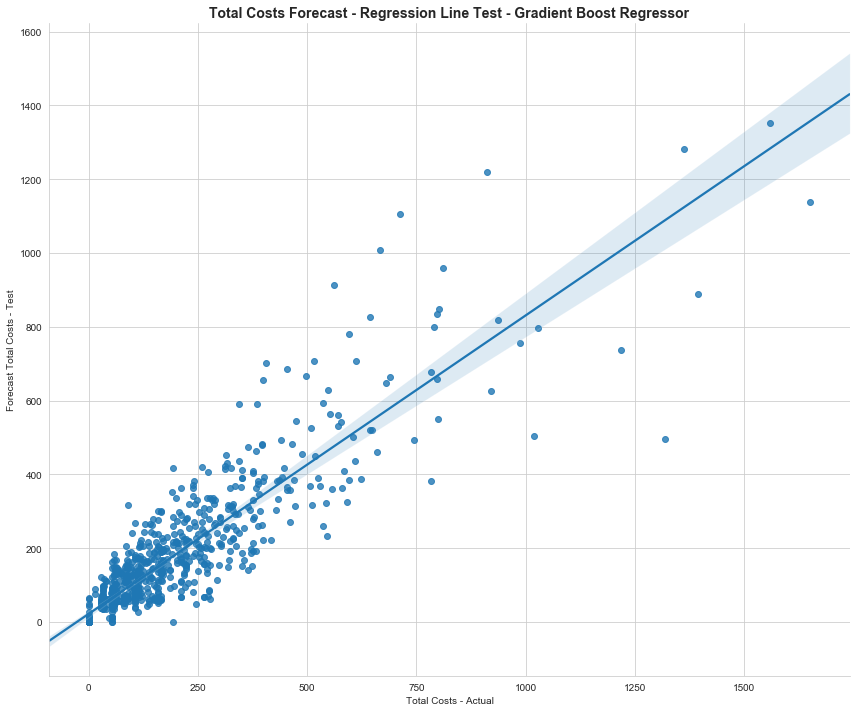

In [178]:
# Graph Test prediction
g = sns.lmplot(x=var_to_predict[0], y='FCST Total Cost Test', data=df_test, height=10, aspect=1.2)
g.set_axis_labels("Total Costs - Actual", "Forecast Total Costs - Test") 
plt.title(var_to_predict_title+ ' - Regression Line Test - Gradient Boost Regressor',
          fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost/'+var_to_predict_save+'_fcst_test_gbr')
plt.show()

#  Bayesian Ridge Regressor model

In [189]:
# Grid Search - Gradient Boosting Regression
np.random.seed(42)

br_param_grid = {'n_iter': np.arange(100, 1000, 100)
                 }
kfold = KFold(n_splits=num_folds)
br = BayesianRidge(normalize=False, compute_score=True)
# Perform grid search: grid_mse
br_grid = GridSearchCV(estimator=br, param_grid=br_param_grid,
                       scoring=scoring, cv=kfold)
br_grid.fit(trainX, trainy)
# Print the best parameters and lowest RMSE
print('BayesianRidge Regression - Grid Search')
print("Best parameters found: ", br_grid.best_params_)
print("Lowest RMSE found: ", np.sqrt(np.abs(br_grid.best_score_))) 
    
   

BayesianRidge Regression - Grid Search
Best parameters found:  {'n_iter': 100}
Lowest RMSE found:  0.3386189505605383


In [204]:
# Modeling based on the outcome of the grid serach of Random Forest Regressor
br = BayesianRidge(n_iter=1000,normalize=False, compute_score=True, tol=0.001)

br.fit(trainX, trainy)

# Predict on test set
yhat_train = br.predict(trainX)

# Predict on test set
yhat = br.predict(testX)

# Calculate Cross valdation scores
scores_br = cross_val_score(br, testX, testy, cv=num_folds, scoring=scoring)

print('BayesianRidge Regressor Train r2 score - Transformed : %.5f' % r2_score(trainy, yhat_train))
print('BayesianRidge Regressor Test r2 score - Transformed  : %.5f' % r2_score(testy, yhat))
yhat_train_mse1 = mean_squared_error(trainy, yhat_train)
yhat_test_mse1 = mean_squared_error(testy, yhat)
yhat_train_rmse1 = np.sqrt(yhat_train_mse1)
yhat_test_rmse1 = np.sqrt(yhat_test_mse1)
print('BayesianRidge Regressor Train MSE - Transformed      : %.5f' % yhat_train_mse1)
print('BayesianRidge Regressor Test MSE - Transformed       : %.5f' % yhat_test_mse1)
print('BayesianRidge Regressor Train RMSE - Transformed     : %.5f' % yhat_train_rmse1)
print('BayesianRidge Regressor Test RMSE - Transformed      : %.5f' % yhat_test_rmse1)

# Plot Cross Validation RMSE Scores
fig = px.line(np.sqrt(np.abs(scores_br)), y=np.sqrt(np.abs(scores_br)), labels={'y':'RMSE'}, title=var_to_predict_title+ ' - RMSE Cross Validation Scores - Transformed')
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_br_crossv.png')
fig.show()

BayesianRidge Regressor Train r2 score - Transformed : 0.89460
BayesianRidge Regressor Test r2 score - Transformed  : 0.87153
BayesianRidge Regressor Train MSE - Transformed      : 0.10761
BayesianRidge Regressor Test MSE - Transformed       : 0.12194
BayesianRidge Regressor Train RMSE - Transformed     : 0.32804
BayesianRidge Regressor Test RMSE - Transformed      : 0.34920


In [205]:
# Untransformed series
un_trainy = trainy.copy()
un_trainy[var_to_predict] = scaler_y.inverse_transform(un_trainy) 

un_testy = testy.copy()
un_testy[var_to_predict] = scaler_y.inverse_transform(un_testy) 

un_yhat_train = pd.DataFrame(data=scaler_y.inverse_transform(yhat_train.reshape(-1, 1)), 
                                  index=trainy.index, columns=var_to_predict) 

un_yhat = pd.DataFrame(data=scaler_y.inverse_transform(yhat.reshape(-1, 1)), 
                                  index=testy.index, columns=var_to_predict) 

# Build Training Dataframe
df_train = un_trainy.copy()
df_train['FCST Total Cost Train'] = un_yhat_train[var_to_predict]
df_train['FCST Error Train'] = un_yhat_train[var_to_predict]
df_train['FCST Error Train'] -= df_train['FCST Total Cost Train']

# Build test dataframe
df_test = un_testy.copy()
df_test['FCST Total Cost Test'] = un_yhat[var_to_predict]
df_test['FCST Error Test'] = df_test[var_to_predict]
df_test['FCST Error Test'] -= df_test['FCST Total Cost Test']

print('Gradient Boost Regressor Train r2 score : %.5f' % r2_score(un_trainy, un_yhat_train))
print('Gradient Boost Regressor Test  r2 score : %.5f' % r2_score(un_testy, un_yhat))
un_yhat_train_mse1 = mean_squared_error(un_trainy, un_yhat_train)
un_yhat_test_mse1 = mean_squared_error(un_testy, un_yhat)
un_yhat_train_rmse1 = np.sqrt(un_yhat_train_mse1)
un_yhat_test_rmse1 = np.sqrt(un_yhat_test_mse1)
print('Gradient Boost Regressor  Train MSE             : %.5f' % un_yhat_train_mse1)
print('Gradient Boost Regressor  Test MSE              : %.5f' % un_yhat_test_mse1)
print('Gradient Boost Regressor  Train RMSE            : %.5f' % un_yhat_train_rmse1)
print('Gradient Boost Regressor  Test RMSE             : %.5f' % un_yhat_test_rmse1)
print('Gradient Boost Regressor  Train Mean FCST Error : %.5f' % df_train['FCST Error Train'].mean())
print('Gradient Boost Regressor  Test Mean FCST Error  : %.5f' % df_test['FCST Error Test'].mean())

Gradient Boost Regressor Train r2 score : 0.76674
Gradient Boost Regressor Test  r2 score : 0.73477
Gradient Boost Regressor  Train MSE             : 9987.35689
Gradient Boost Regressor  Test MSE              : 10858.98040
Gradient Boost Regressor  Train RMSE            : 99.93676
Gradient Boost Regressor  Test RMSE             : 104.20643
Gradient Boost Regressor  Train Mean FCST Error : 0.00000
Gradient Boost Regressor  Test Mean FCST Error  : 13.42083


# Random Forest Regressor Model

In [202]:
# Grid Search - Gradient Boosting Regression
np.random.seed(42)
rfr_param_grid = {'n_estimators': [100, 250, 500],'n_jobs':[10],
                  'max_depth': np.arange(2, 200, 25), 'verbose':[0]
                 }
kfold = KFold(n_splits=num_folds)
rfr = RandomForestRegressor()
# Perform grid search: grid_mse
rfr_grid = GridSearchCV(estimator=rfr, param_grid=rfr_param_grid,
                       scoring=scoring, cv=kfold)
rfr_grid.fit(trainX, trainy)
# Print the best parameters and lowest RMSE
print('Random Forest Regression - Grid Search')
print("Best parameters found: ", rfr_grid.best_params_)
print("Lowest RMSE found: ", np.sqrt(np.abs(rfr_grid.best_score_)))

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    4.0s
[Parallel(n_jobs=10)]: Done  81 out of 100 | elapsed:    4.2s remaining:    0.9s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    5.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed: 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.3s finished
[P

[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Don

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Usi

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 300 tasks      | elapsed:    0.5s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    1.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 300 tasks      | elapsed:    0.5s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    1.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent worker

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    4.8s finished
[Parallel(n_jobs=10)]: Using backend T

[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 200 tasks      | elapsed:    1.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      |

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.6s finished
[P

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.8s finished
[Parallel(n_jobs=10)]: Using backend T

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.4s finished
[P

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.4s finished
[P

[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend Loky

[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.7s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      |

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    6.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      |

[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent worker

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    6.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      |

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      |

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.4s finished
[P

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    0.7s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.4s finished
[P

[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend Loky

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1

[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    6.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      |

[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent worker

[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tas

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1

[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Par

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[P

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out

[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend Loky

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    6.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      |

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.2s finished
[P

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      |

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Paral

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 tasks      | elapsed:    0.6s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 200 tasks      | elapsed:    1.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.2s finished
[Parallel(n_jobs=10)]: Using backend T

[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]:

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[P

[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    0.7s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend Loky

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 tasks      | elapsed:    0.6s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.2s finished
[Parallel(n_jobs=10)]: Using backend T

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      |

[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent worker

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1

[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      |

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.4s finished
[P

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.3s finished
[Parallel(n_jobs=10)]: Using backend T

[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      |

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[P

[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 tasks      | elapsed:    0.6s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[P

[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend Loky

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1

[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      |

[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 tasks      | elapsed:    0.6s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Paral

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.2s finished
[Parallel(n_jobs=10)]: Using backend T

[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      |

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      |

[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[P

[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend Loky

[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.3s finished
[Parallel(n_jobs=10)]: Using backend T

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent worker

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    0.7s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elaps

[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=1

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Usi

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    6.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    6.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      |

[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    2.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent worker

[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    8.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    7.7s finished
[Parallel(n_jobs=10)]: Using backend T

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    2.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    4.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    4.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    7.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    7.8s finished
[Parallel(n_jobs=10)]: Using backend T

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    2.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    2.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n

[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    7.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    8.3s finished
[Parallel(n_jobs=10)]: Using backend T

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    4.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    4.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    1.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    8.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]:

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    2.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Usi

[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    8.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    7.8s finished
[Parallel(n_jobs=10)]: Using backend T

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    2.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    4.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    7.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 t

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Done  80 tasks      | elapsed:    0.7s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elaps

[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    8.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    8.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      |

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  80 tasks      | elapsed:    0.7s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n

[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    8.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    7.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 780 tasks      |

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    2.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.8s finished
[P

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    4.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    1.2s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    8.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    8.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 780 tasks      |

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    2.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Usi

[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    1.4s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    9.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    8.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=1

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    4.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.2s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    4.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    9.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]:

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    4.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Usi

[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    8.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.3s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    8.6s finished
[Parallel(n_jobs=10)]: Using backend T

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    2.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    1.2s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    4.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    9.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 t

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    1.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.2s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    4.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    4.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Done 100 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    9.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    9.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      |

[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    2.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    2.2s finished
[Parallel(n_jobs=

[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    9.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    8.9s finished
[Parallel(n_jobs=10)]: Using backend T

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    2.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    2.1s finished
[P

[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    4.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elaps

[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    2.4s


Random Forest Regression - Grid Search
Best parameters found:  {'bootstrap': True, 'max_depth': 112, 'n_estimators': 500, 'n_jobs': 10, 'oob_score': False, 'verbose': 1}
Lowest RMSE found:  0.3359591068471264


[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.7s finished


# Observation
These are the best parameters:

First run identifying parameters
    * Random Forest Regression - Grid Search
    * Best parameters found:  {'bootstrap': True, 'max_depth': 112, 'n_estimators': 500, 'n_jobs': 10, 'oob_score': False, 'verbose': 1}
    * Lowest RMSE found:  0.3359591068471264

In [206]:
# Modeling based on the outcome of the grid serach of Random Forest Regressor
rfr = RandomForestRegressor(max_depth=112, n_estimators=500, verbose=0)

rfr.fit(trainX, trainy)

# Predict on test set
yhat_train = rfr.predict(trainX)

# Predict on test set
yhat = rfr.predict(testX)

# Calculate Cross valdation scores
scores_rfr = cross_val_score(rfr, testX, testy, cv=num_folds, scoring=scoring)

print('Random Forest Regressor Train r2 score - Transformed : %.5f' % r2_score(trainy, yhat_train))
print('Random Forest Regressor Test r2 score - Transformed  : %.5f' % r2_score(testy, yhat))
yhat_train_mse1 = mean_squared_error(trainy, yhat_train)
yhat_test_mse1 = mean_squared_error(testy, yhat)
yhat_train_rmse1 = np.sqrt(yhat_train_mse1)
yhat_test_rmse1 = np.sqrt(yhat_test_mse1)
print('Random Forest Regressor Train MSE - Transformed      : %.5f' % yhat_train_mse1)
print('Random Forest Regressor Test MSE - Transformed       : %.5f' % yhat_test_mse1)
print('Random Forest Regressor Train RMSE - Transformed     : %.5f' % yhat_train_rmse1)
print('Random Forest Regressor Test RMSE - Transformed      : %.5f' % yhat_test_rmse1)

# Plot Cross Validation RMSE Scores
fig = px.line(np.sqrt(np.abs(scores_rfr)), y=np.sqrt(np.abs(scores_rfr)), labels={'y':'RMSE'}, title=var_to_predict_title+ ' - RMSE Cross Validation Scores - Transformed')
fig.write_image('./model_pics/total_cost/'+var_to_predict_save+'_rfr_crossv.png')
fig.show()

Random Forest Regressor Train r2 score - Transformed : 0.98498
Random Forest Regressor Test r2 score - Transformed  : 0.87626
Random Forest Regressor Train MSE - Transformed      : 0.01533
Random Forest Regressor Test MSE - Transformed       : 0.11746
Random Forest Regressor Train RMSE - Transformed     : 0.12383
Random Forest Regressor Test RMSE - Transformed      : 0.34272


In [207]:
# Untransformed series
un_trainy = trainy.copy()
un_trainy[var_to_predict] = scaler_y.inverse_transform(un_trainy) 

un_testy = testy.copy()
un_testy[var_to_predict] = scaler_y.inverse_transform(un_testy) 

un_yhat_train = pd.DataFrame(data=scaler_y.inverse_transform(yhat_train.reshape(-1, 1)), 
                                  index=trainy.index, columns=var_to_predict) 

un_yhat = pd.DataFrame(data=scaler_y.inverse_transform(yhat.reshape(-1, 1)), 
                                  index=testy.index, columns=var_to_predict) 

# Build Training Dataframe
df_train = un_trainy.copy()
df_train['FCST Total Cost Train'] = un_yhat_train[var_to_predict]
df_train['FCST Error Train'] = un_yhat_train[var_to_predict]
df_train['FCST Error Train'] -= df_train['FCST Total Cost Train']

# Build test dataframe
df_test = un_testy.copy()
df_test['FCST Total Cost Test'] = un_yhat[var_to_predict]
df_test['FCST Error Test'] = df_test[var_to_predict]
df_test['FCST Error Test'] -= df_test['FCST Total Cost Test']

print('Random Forest Regressor Train r2 score         : %.5f' % r2_score(un_trainy, un_yhat_train))
print('Random Forest Regressor Test  r2 score         : %.5f' % r2_score(un_testy, un_yhat))
un_yhat_train_mse1 = mean_squared_error(un_trainy, un_yhat_train)
un_yhat_test_mse1 = mean_squared_error(un_testy, un_yhat)
un_yhat_train_rmse1 = np.sqrt(un_yhat_train_mse1)
un_yhat_test_rmse1 = np.sqrt(un_yhat_test_mse1)
print('Random Forest Regressor  Train MSE             : %.5f' % un_yhat_train_mse1)
print('Random Forest Regressor  Test MSE              : %.5f' % un_yhat_test_mse1)
print('Random Forest Regressor  Train RMSE            : %.5f' % un_yhat_train_rmse1)
print('Random Forest Regressor  Test RMSE             : %.5f' % un_yhat_test_rmse1)
print('Random Forest Regressor  Train Mean FCST Error : %.5f' % df_train['FCST Error Train'].mean())
print('Random Forest Regressor  Test Mean FCST Error  : %.5f' % df_test['FCST Error Test'].mean())

Random Forest Regressor Train r2 score         : 0.96954
Random Forest Regressor Test  r2 score         : 0.79884
Random Forest Regressor  Train MSE             : 1304.05281
Random Forest Regressor  Test MSE              : 8235.74477
Random Forest Regressor  Train RMSE            : 36.11167
Random Forest Regressor  Test RMSE             : 90.75100
Random Forest Regressor  Train Mean FCST Error : 0.00000
Random Forest Regressor  Test Mean FCST Error  : 10.75062


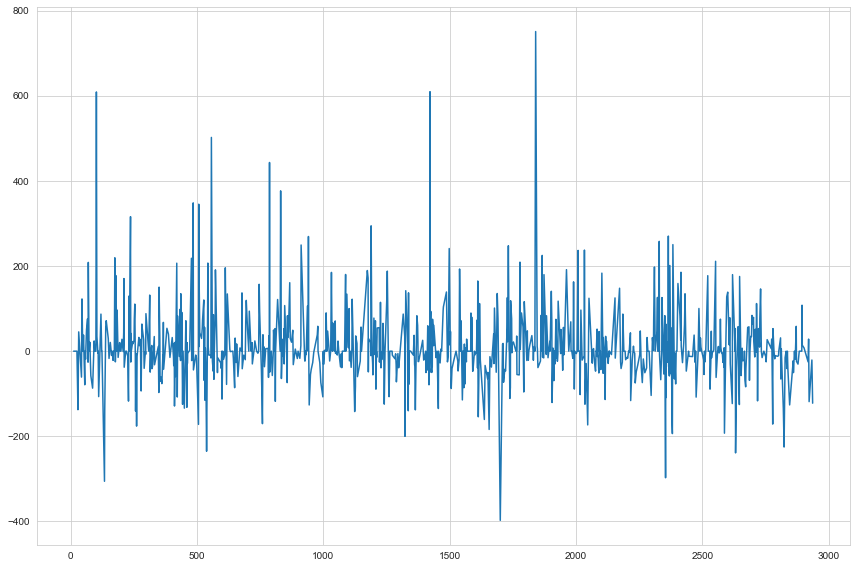

In [208]:
sns.lineplot(data=df_test['FCST Error Test'])
plt.show()

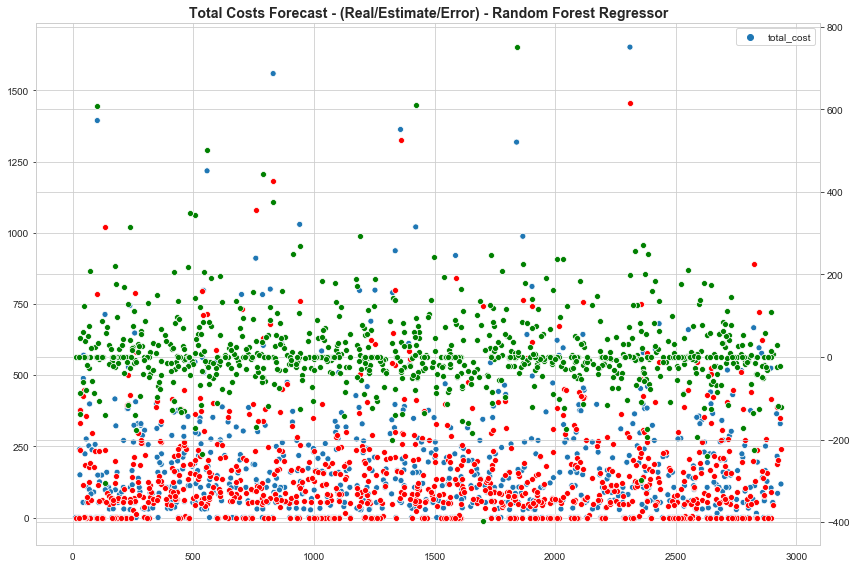

In [209]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
sns.scatterplot(data=df_test[var_to_predict], color="b", legend='full', ax=ax1)
sns.scatterplot(data=df_test['FCST Total Cost Test'], color="r", legend='full', ax=ax1)
sns.scatterplot(data=df_test['FCST Error Test'], color="g", legend='full', ax=ax2)
plt.title(var_to_predict_title+ ' - (Real/Estimate/Error) - Random Forest Regressor',
          fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost/'+var_to_predict_save+'_scatter_rfr')
plt.show()

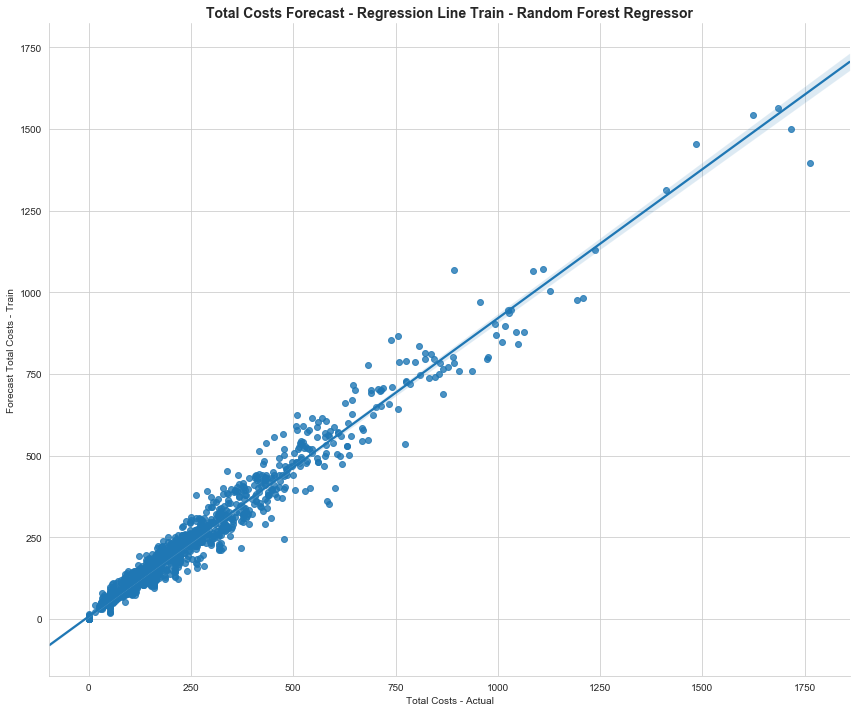

In [210]:
# Graph Train prediction
sns.set_style("whitegrid", {'axes.grid' : True})
g = sns.lmplot(x=var_to_predict[0], y='FCST Total Cost Train', data=df_train, height=10, aspect=1.2)
g.set_axis_labels("Total Costs - Actual", "Forecast Total Costs - Train") 
plt.title(var_to_predict_title+ ' - Regression Line Train - Random Forest Regressor',fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost/'+var_to_predict_save+'_fcst_train_rfr')
plt.show()

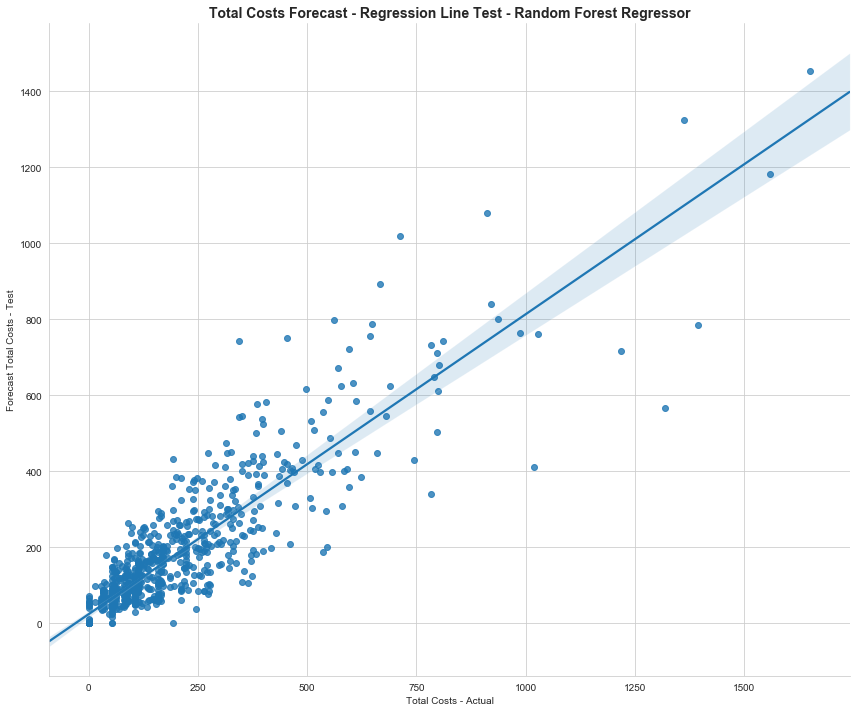

In [211]:
# Graph Test prediction
g = sns.lmplot(x=var_to_predict[0], y='FCST Total Cost Test', data=df_test, height=10, aspect=1.2)
g.set_axis_labels("Total Costs - Actual", "Forecast Total Costs - Test") 
plt.title(var_to_predict_title+ ' - Regression Line Test - Random Forest Regressor',
          fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost/'+var_to_predict_save+'_fcst_test_rfr')
plt.show()

# ExtraTreeRegressor Model

In [219]:
# Grid Search 
np.random.seed(42)
et_param_grid={
        'n_estimators': np.arange(50,126,25),
        #'min_samples_leaf': np.arange(1,5,1),
        #'min_samples_split': np.arange(2,5,1),
    }

kfold = KFold(n_splits=num_folds)
et = ExtraTreesRegressor(n_estimators=100, n_jobs=4, max_features='auto')
# Perform grid search: grid_mse
et_grid = GridSearchCV(estimator=et, param_grid=et_param_grid,
                       scoring=scoring, cv=kfold)
et_grid.fit(trainX, trainy)
# Print the best parameters and lowest RMSE
print('ExtraTrees Regression - Grid Search')
print("Best parameters found: ", et_grid.best_params_)
print("Lowest RMSE found: ", np.sqrt(np.abs(et_grid.best_score_)))

ExtraTrees Regression - Grid Search
Best parameters found:  {'n_estimators': 100}
Lowest RMSE found:  0.34456254723959895


# Keras Modeling

In [ ]:
# Keras Classifier
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.optimizers import SGD


np.random.seed(42)
# Create input and output dataframes

num_folds = 10
scoring = 'accuracy'

# create model
keras_nn = Sequential()
keras_nn.add(Dense(trainX.shape[1], input_dim=trainX.shape[1], activation='relu'))
keras_nn.add(Dropout(0.2))
keras_nn.add(Dense(int(trainX.shape[1]/2), activation='relu'))
keras_nn.add(Dense(1, activation='sigmoid'))
# Compile model
sgd = SGD(lr=0.01, momentum=0.8)
keras_nn.compile(loss='binary_crossentropy', optimizer=sgd, metrics=[scoring])
# Fit the model
history = keras_nn.fit(trainX, trainy, validation_data=(testX,testy), epochs=150, batch_size=10, verbose=1)
# evaluate the model
scores = keras_nn.evaluate(trainX, trainy, verbose=0)
print("Keras - Accuracy Train Set : %.3f" % scores[1])
scores = keras_nn.evaluate(testX, testy, verbose=0)
print("Keras - Accuracy Test Set  : %.3f" % scores[1])

In [ ]:
# Visualize training history
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Keras Model accuracy - '+var_to_predict_title )
plt.ylabel('Accuracy')
plt.xlabel('epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.savefig('./model_pics/total_cost/'+var_to_predict_save+'_keras_model_1')
plt.show()

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Keras Model Loss - '+ var_to_predict_title)
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.savefig('./model_pics/total_cost/'+var_to_predict_save+'_keras_model_2')
plt.show()

# Not used from this point below. 

# SVM Model

In [ ]:
# SVM grid search evaluation

np.random.seed(42)
num_folds = 10
scoring = 'accuracy'

c_values = [0.1, 0.3, 0.5, 0.7, 0.9, 1.0, 1.3, 1.5, 1.7, 2.0, 2.3, 2.5, 2.7, 3.0]
kernel_values = ['linear', 'poly', 'rbf', 'sigmoid']
param_grid = dict(C=c_values, kernel=kernel_values)
svc = SVC(gamma='auto')
kfold = KFold(n_splits=num_folds)
grid = GridSearchCV(estimator=svc, param_grid=param_grid, scoring=scoring, cv=kfold, iid=True)
grid_result = grid.fit(trainX, trainy)
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

# Scaler Testing

In [ ]:
# Scale fields using Standard Scaler

features_to_scale = ['aaa_mean_age', 'length_of_residence', 'aaa_mean_child', 
                     'total_calls', 'total_member_cost', 'total_cost'
                    ]
df = pd.DataFrame(df_test_over, columns=features_to_scale)

# Standard Scaler
scaler = StandardScaler()
scaled_df_std = scaler.fit_transform(df)
scaled_df_std = pd.DataFrame(scaled_df_std, columns=features_to_scale)


for col in features_to_scale:
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
    
    ax1.set_title('Before Scaling Standard Scaler')
    ax2.set_title('After Standard Scaler')

    sns.kdeplot(df[col], ax=ax1)
    sns.kdeplot(scaled_df_std[col], ax=ax2)
    plt.show()

In [ ]:
scaled_df_std.describe()

In [ ]:
# Scale fields using Min-Max scaler

features_to_scale = ['aaa_mean_age', 'length_of_residence', 'aaa_mean_child', 
                     'total_calls', 'total_member_cost', 'total_cost'
                    ]
df = pd.DataFrame(df_test_over, columns=features_to_scale)

# Min-Max Scaler
scaler = MinMaxScaler()
scaled_df_mm = scaler.fit_transform(df)
scaled_df_mm = pd.DataFrame(scaled_df_mm, columns=features_to_scale)

for col in features_to_scale:
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
    ax1.set_title('Before Scaling Min-Max')
    sns.kdeplot(df[col], ax=ax1)
    ax2.set_title('After Min-Max Scaling')
    sns.kdeplot(scaled_df_mm[col], ax=ax2)
    plt.show()

In [ ]:
scaled_df_mm.describe()

In [ ]:
# Scale fields using Robust Scaler

features_to_scale = ['aaa_mean_age', 'length_of_residence', 'aaa_mean_child', 
                     'total_calls', 'total_member_cost', 'total_cost'
                    ]
df = pd.DataFrame(df_test_over, columns=features_to_scale)

# Robust Scaler- excellent with outliers
scaler = RobustScaler()
scaled_df_rs = scaler.fit_transform(df)
scaled_df_rs = pd.DataFrame(scaled_df_rs, columns=features_to_scale)
for col in features_to_scale:
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
    ax1.set_title('Before Scaling Robust Scaling')
    sns.kdeplot(df[col], ax=ax1)
    ax2.set_title('After Robust Scaling')
    sns.kdeplot(scaled_df_rs[col], ax=ax2)
    plt.show()

In [ ]:
scaled_df_rs.describe()

In [ ]:
# Scale fields using Normalizer

features_to_scale = ['aaa_mean_age', 'length_of_residence', 'aaa_mean_child', 
                     'total_calls', 'total_member_cost', 'total_cost'
                    ]
df = pd.DataFrame(df_test_over, columns=features_to_scale)

# Normalizer
scaler = Normalizer()
scaled_df_nm = scaler.fit_transform(df)
scaled_df_nm = pd.DataFrame(scaled_df_nm, columns=features_to_scale)
for col in features_to_scale:
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
    ax1.set_title('Before Scaling Normalizer')
    sns.kdeplot(df[col], ax=ax1)
    ax2.set_title('After Normalizer')
    sns.kdeplot(scaled_df_nm[col], ax=ax2)
    plt.show()

In [ ]:
scaled_df_nm.describe()

In [ ]:
# Scale fields using Quantile Transformer

features_to_scale = ['aaa_mean_age', 'length_of_residence', 'aaa_mean_child', 
                     'total_calls', 'total_member_cost', 'total_cost'
                    ]
df = pd.DataFrame(df_test_over, columns=features_to_scale)

# QuantileTransformer
scaler = QuantileTransformer(n_quantiles=200, output_distribution='normal')
scaled_df_qt = scaler.fit_transform(df)
scaled_df_qt = pd.DataFrame(scaled_df_qt, columns=features_to_scale)
for col in features_to_scale:
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
    ax1.set_title('Before Scaling QuantileTransformer')
    sns.kdeplot(df[col], ax=ax1)
    ax2.set_title('After QuantileTransformer')
    sns.kdeplot(scaled_df_nm[col], ax=ax2)
    plt.show()

In [ ]:
scaled_df_qt.describe()

In [ ]:
# Scale fields using Power Transformer

features_to_scale = ['aaa_mean_age', 'length_of_residence', 'aaa_mean_child', 
                     'total_calls', 'total_member_cost', 'total_cost'
                    ]
df = pd.DataFrame(df_test_over, columns=features_to_scale)

# PowerTransformer
scaler = PowerTransformer(method='yeo-johnson', standardize=True, copy=True)
scaled_df_pt = scaler.fit_transform(df)
scaled_df_pt = pd.DataFrame(scaled_df_pt, columns=features_to_scale)
for col in features_to_scale:
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
    ax1.set_title('Before Scaling PowerTransformer')
    sns.kdeplot(df[col], ax=ax1)
    ax2.set_title('After PowerTransformer')
    sns.kdeplot(scaled_df_nm[col], ax=ax2)
    plt.show()

In [ ]:
scaled_df_pt.describe()

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(df_test_over[var_to_predict[0]].values)
plt.xlabel('Row number')
plt.ylabel('y value')
plt.title('Change in y value over the data set')
plt.show();